In [11]:
# toggle between "notebook" and "inline", if graphs are not directly displayes
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

from matplotlib.patches import ConnectionPatch
from matplotlib.legend import Legend
from matplotlib.patches import Rectangle
from matplotlib_venn import venn2
from matplotlib import gridspec

from collections import OrderedDict

from statannot import add_stat_annotation
from statannotations.Annotator import Annotator

import upsetplot

import calour as ca
ca.set_log_level(40)

from ggmap.workflow import *

ggmap is custome code from Stefan Janssen, download at https://github.com/sjanssen2/ggmap, using commit '5904cfe8a5c40819e56a15d1b62bee58e6353c21'
Reading settings file '/homes/sjanssen/.ggmaprc'


In [3]:
# an ugly mechanism to list my currently installes packages
cluster_run(['conda list > conda_list', 'rm -f dummy'], 
            'get_packages', 
            './dummy', 
            dry=False, use_grid=False, environment='notebookServer')
!cat conda_list

# packages in environment at /homes/sjanssen/miniconda3/envs/notebookServer:
#
# Name                    Version                   Build  Channel
_libgcc_mutex             0.1                 conda_forge    conda-forge
_openmp_mutex             4.5                       2_gnu    conda-forge
alsa-lib                  1.2.8                h166bdaf_0    conda-forge
anyio                     3.6.2              pyhd8ed1ab_0    conda-forge
appdirs                   1.4.4              pyh9f0ad1d_0    conda-forge
argon2-cffi               21.3.0             pyhd8ed1ab_0    conda-forge
argon2-cffi-bindings      21.2.0          py310h5764c6d_3    conda-forge
asttokens                 2.2.1              pyhd8ed1ab_0    conda-forge
attr                      2.5.1                h166bdaf_1    conda-forge
attrs                     22.2.0             pyh71513ae_0    conda-forge
backcall                  0.2.0              pyh9f0ad1d_0    conda-forge
backports                 1.0                pyhd8e

In [4]:
# also report settings in the personal ~/.ggmaprc file
!cat $HOME/.ggmaprc

R_module: R/3.3.2
condaenv_picrust: ggmap_picrust1
condaenv_qiime1: qiime_env
condaenv_qiime2: qiime2-2023.5
dir_conda: /homes/sjanssen/miniconda3/
fp_binary_time: /usr/bin/time
fp_reference_phylogeny: null
fp_reference_taxonomy: /projects/emp/03-otus/reference/97_otu_taxonomy.txt
fp_reference_sepp: /homes/sjanssen/MicrobiomeAnalyses/References/sepp-refs-gg-13-8.qza
grid_account: 'chaos'
list_ranks:
- Kingdom
- Phylum
- Class
- Order
- Family
- Genus
- Species
use_grid: true
prefer_slurm: true


## Definitions

In [5]:
NA_VALUES = ['not applicable', 'not collected', 'not provided']
ORDER_GENERATIONS = ['RM','P','F1','F2','F3','F4','F5','Controls']
KEY_GENERATIONS = lambda x: x.apply(lambda a: ORDER_GENERATIONS.index(a))
ORDER_TAXPLOT = ['Janvier B6J', 'Duesseldorf B6J', 'F5_B2', 'F5_B3', 'F4_B1', 'F4_B2', 'F4_B3', 'F3_B1', 'F3_B2', 'F3_B3', 'F2_B1', 'F2_B2', 'F2_B3', 'F1_B1', 'F1_B2', 'F1_B3', 'P_B1', 'P_B2', 'P_B3', 'RM', 
                 'P_C1', 'P_C2', 'F1_C1', 'F1_C2', 'F2_C1', 'F2_C2', 'F3_C1', 'F3_C2', 'F3_C3', 'F4_C1', 'F4_C2', 'F4_C3', 'F5_C1', 'F5_C2', 'F5_C3', 'Duesseldorf C', 'Janvier C', ]
KEY_TAXPLOT = lambda x: x.apply(lambda a: ORDER_TAXPLOT.index(a))

ORDER_GENOTYPE = ['B6J', 'C']
COLORS = {
    'B6J': '#0000ff',
    'C': '#f27304',
    "RM": "#ff0000",
    
    'P': '#8e0152',
    'F1': '#d6589e',
    'F2': '#f5c4e1',
    'F3': '#c7e89f',
    'F4': '#6eae36',
    'F5': '#276419',
    
    'mJAX': '#ff0000',
    'mTAC': '#0000ff',
    
    "B1": "#deebf7", 
    "B2": "#9ecae1", 
    "B3": "#3182bd",
    "C1": "#fee8c8",
    "C2": "#fdbb84",
    "C3": "#e34a33",
}
DM_NAMES = {
    'PD_whole_tree': "Faith's PD",
    'unweighted_unifrac': 'unweighted UniFrac',
    'weighted_unifrac': 'weighted UniFrac',
    'observed_features': 'observed features',
    'shannon': 'Shannon Entropy',
}

def alpha_blending(hex_color, alpha) :
    """ alpha blending as if on the white background.
    """
    foreground_tuple  = matplotlib.colors.hex2color(hex_color)
    foreground_arr = np.array(foreground_tuple)
    final = tuple( (1. -  alpha) + foreground_arr*alpha )
    return(final)

def _sample_level(sample, field='cage_line', just_host_genotype=False):
    """Assign sample categories based on multiple selected metadata fields"""
    if pd.notnull(sample[field]):
        if just_host_genotype:
            return sample['host_genotype']
        else:
            return sample[field]
    if sample['host_genotype'] == 'RM':
        return sample['host_genotype']
    if pd.notnull(sample['control']):
        return '%s %s' % (sample['control'], sample['host_genotype'])


## Obtain data

Data are managed with Qiita as the public study with ID 13422. You can obtain all necessary data through three alternative ways:

(Note: the ITS sequencing to profile fungi was not successful, i.e. too low read qualities. Ignore this preparation in Qiita!)

1. per sample forward and reverse fastq.gz files from ENA, accession LINK
2. metadata and precomputed feature table (bacteria * samples) from our public Qiita study: [https://qiita.ucsd.edu/study/description/13422](https://qiita.ucsd.edu/study/description/13422). fastq.gz files are also available through Qiita.
3. **metadata and precomputed feature table (bacteria * samples) via [github](https://github.com/jlab/microbiome_benga_multiplegenerations), which are actually downloaded from Qiita for your convenience**

The per sample forward and reverse fastq.gz result from: base calling and simultaneous demultiplexing was done via bcl2fastq (v2.19.0.316) and primers were trimmed using cutadapt (v2.10, Martin 2011).

In [6]:
# obtain metadata from Qiita as the combination of "Sample Info" and "Prep Info"
metadata = pd.concat([pd.read_csv("FromQiita/%s" % filename, sep="\t", dtype=str, na_values=NA_VALUES, index_col=0)
                      for filename in ["13422_prep_11649_20220103-015657.txt",  # Prep Info
                                       "13422_20231103-093637.txt"              # Sample Info
                                      ]], axis=1)

# make values true numbers
metadata['serum_triglyceride'] = metadata['serum_triglyceride'].astype(float)

metadata['gave_birth'] = metadata['gave_birth'].apply(lambda x: x == 'True')
metadata['mate_sire'] = metadata['mate_sire'].apply(lambda x: x == 'True')

# use abbreviations for "host genotype" as in the manuscript
metadata['host_genotype'] = metadata['host_genotype'].apply(lambda x: {'c57bl6/j': 'B6J',
                                                                       'balb/c': 'C',
                                                                       'b6cf1': 'RM'}.get(x, x))
metadata['cage_line'] = metadata['cage_line'].apply(lambda x: {'C57BL6/J_line1': 'B1',
                                                               'C57BL6/J_line2': 'B2',
                                                               'C57BL6/J_line3': 'B3',
                                                               'BALB/c_line4': 'C1',
                                                               'BALB/c_line5': 'C2',
                                                               'BALB/c_line6': 'C3',}.get(x,x))

# give locations shorter names
metadata['geo_loc_name'] = metadata['geo_loc_name'].apply(lambda x: {'France:Janvier': 'Janvier',
                                                                     'Germany:Duesseldorf': 'Duesseldorf'}.get(x,x))

# provide extra field to easily identify control (Janvier / Duesseldorf) samples
metadata['control'] = metadata[(metadata['host_scientific_name'] == 'mus musculus') &
                               ((metadata['geo_loc_name'] == 'Janvier') |
                               (metadata['iacuc_institute'] == 'ZETT'))]['geo_loc_name'].apply(lambda x: {'Janvier': 'Janvier',
                                                                                                          'Duesseldorf': 'Duesseldorf'}.get(x, np.nan))

metadata['sample_category'] = metadata.apply(lambda x: _sample_level(x, 'cage_line', True), axis=1)
metadata['sample_category_cagelines'] = metadata.apply(lambda x: _sample_level(x, 'cage_line', False), axis=1)
metadata['sample_category_generation'] = metadata.apply(lambda x: _sample_level(x, 'generation', False), axis=1)
metadata['generation_cageline'] = metadata.apply(lambda row: '%s%s' % (row['generation'] if pd.notnull(row['generation']) else row['sample_category'],
                                                                       '_' + row['cage_line'] if pd.notnull(row['cage_line']) else ''), axis=1)
metadata['independent_cage_lineage'] = metadata['cage_line'].apply(lambda x: x[-1] if pd.notnull(x) else x)

metadata['serum_triglyceride'] = metadata['serum_triglyceride'].astype(float)

In [7]:
# subset metadata to gut and skin, as we rarefy these samples differently to account for different 
# read coverage due to low biomass in skin

meta_gut = metadata[(metadata['host_scientific_name'] == 'mus musculus') &  # ignore marmoset control samples
                    (metadata['host_body_site'] == 'uberon:colon')]         # only select gut

meta_skin = metadata[(metadata['host_scientific_name'] == 'mus musculus') &           # ignore marmoset control samples
                     (metadata['host_body_site'] == 'uberon:skin of external ear') &  # only select skin
                     (metadata['batch'] != '2')]                                      # 12 skin samples have been sequenced twice, just use the better quality run

# same for the feature table
counts = biom2pandas("FromQiita/128106_reference-hit.biom")
counts_gut = counts.loc[:, meta_gut.index]
counts_skin = counts.loc[:, meta_skin.index]

## Rarefy, assign taxonomy & compute alpha- and beta- diversities

In [8]:
sepp_tree = TreeNode.read("FromQiita/128106_insertion_tree.relabelled.tre", format="newick")

**Note:** rarefaction is an inherently randomized process, i.e. if you re-compute from scratch, you will probably find small differences to the published version.

In order to provide you with almost identical results, we packaged cached results that are affected by rarefaction into the repository. Should you NOT want to use them, remove all file in the hidden subdirectory `.anacache`.

Information: 15572 of 16581 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/fb75800fd64d05f9c017bb7fe4cbaa2f.taxRDP'. 
Using existing results from '.anacache/c8cc907120a605fd111f28cbbcdc3132.taxRDP'. 
In total, 68 reads (0.000761%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/45f4ad6aa8c061c224e8ea8d1f520e90.rare'. 
Using existing results from '.anacache/d79cf3e0463ada8377c87cc9f28466d3.rarefy'. 
Using existing results from '.anacache/ea8b986615c8ba8794f43d4a3bda3205.adiv'. 
Using existing results from '.anacache/01a0386e5df55244d0c74b30a44cb014.bdiv'. 
Using existing results from '.anacache/0844d1545b9f5f2406a0d55e9a05c078.emperor'. 
Your final feature table is composed of 333 samples and 946 features.


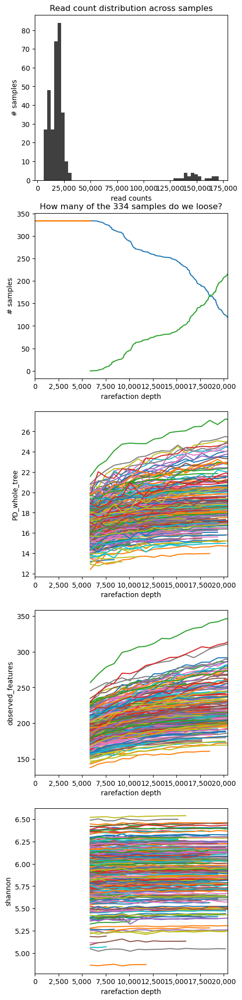

In [12]:
res_gut = process_study(
    metadata=meta_gut,
    control_samples=set([]),  # we already filtered out all control samples
    fp_deblur_biom=counts_gut,  # "abuse" argument to provide a table instead of a filepath
    fp_insertiontree="FromQiita/128106_insertion_tree.relabelled.tre",
    rarefaction_depth=6000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',  # as GG2 currently lacks labels for mitochondria/chloroplasts, see https://forum.qiime2.org/t/taxonomy-filtering-greengenes2/28334
    fp_taxonomy_trained_classifier="/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg_2022_10_backbone_full_length.nb_2023.5.qza",  # obtain this file from https://docs.qiime2.org/2023.9/data-resources/
    tree_insert=sepp_tree,
    is_v4_region=False,
    emperor_fp='Generated/Emperor',
    emperor_infix='_gut',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    emperor_skip_tsne_umap=True,
)

Information: 13989 of 16581 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/206b4f1b39ea712ab5d760ffff2c34e8.taxRDP'. 
Using existing results from '.anacache/55396ded28375658d78d971ed88c6a21.taxRDP'. 
Information: You are loosing a significant amount of reads due to filtration of plant material!
sample_name
13422.261skin    0.969867
13422.105skin    0.617978
13422.184skin    0.606910
13422.94skin     0.594700
13422.198skin    0.569706
13422.93skin     0.566410
13422.182skin    0.542338
13422.183skin    0.480861
13422.180skin    0.456916
13422.95skin     0.456491
dtype: float64
In total, 48190 reads (4.163902%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/4a8ec3db8b41508e885660718bdbfc78.rare'. 
Using existing results from '.anacache/043ed8c172d45ff81d56c502def137d9.rarefy'. 
Using existing results from '.anacache/392e0fe800ebdb356

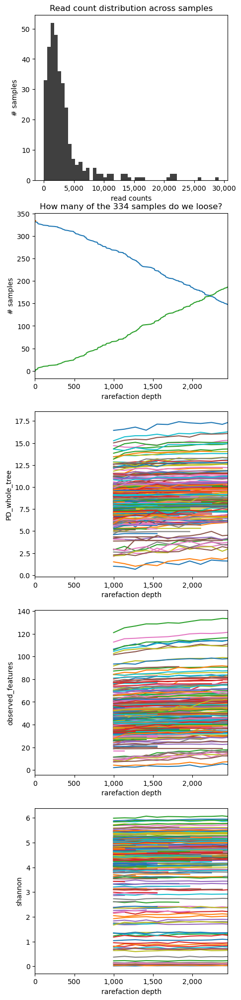

In [14]:
res_skin = process_study(
    metadata=meta_skin,
    control_samples=set([]),  # we already filtered out all control samples
    fp_deblur_biom=counts_skin,  # "abuse" argument to provide a table instead of a filepath
    fp_insertiontree="FromQiita/128106_insertion_tree.relabelled.tre",
    rarefaction_depth=1000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',  # as GG2 currently lacks labels for mitochondria/chloroplasts, see https://forum.qiime2.org/t/taxonomy-filtering-greengenes2/28334
    fp_taxonomy_trained_classifier="/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg_2022_10_backbone_full_length.nb_2023.5.qza",  # obtain this file from https://docs.qiime2.org/2023.9/data-resources/
    tree_insert=sepp_tree,
    is_v4_region=False,
    emperor_fp='Generated/Emperor',
    emperor_infix='_skin',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    emperor_skip_tsne_umap=True,
)

Information: 13174 of 16581 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/01cfd1f4d662ff78471d74fb1ce94cd5.taxRDP'. 
Using existing results from '.anacache/bca9ebfbf4293a89b622a5a2e9756ff8.taxRDP'. 
Information: You are loosing a significant amount of reads due to filtration of plant material!
13422.261skin    0.969652
13422.lung364    0.949258
13422.105skin    0.617978
13422.184skin    0.606910
13422.94skin     0.594700
13422.198skin    0.569706
13422.93skin     0.566410
13422.182skin    0.541966
13422.183skin    0.480861
13422.180skin    0.456916
dtype: float64
In total, 65501 reads (0.615396%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/4317229f586ab0016365cf35887417b9.rare'. 
Using existing results from '.anacache/564f894085825a176e0ca0b59c58d9c4.rarefy'. 
Using existing results from '.anacache/504489e89558a42b8eb4656c2cb6b

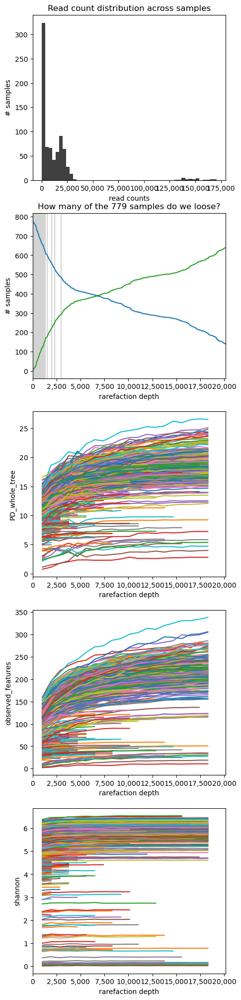

In [15]:
idx_control_samples = set(metadata[metadata['sample_type'].isin(['sterile water', 'control bedding', 'control food'])].index)
res_both = process_study(
    metadata=metadata,
    control_samples=idx_control_samples,
    fp_deblur_biom=counts,  # "abuse" argument to provide a table instead of a filepath
    fp_insertiontree="FromQiita/128106_insertion_tree.relabelled.tre",
    rarefaction_depth=1000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',  # as GG2 currently lacks labels for mitochondria/chloroplasts, see https://forum.qiime2.org/t/taxonomy-filtering-greengenes2/28334
    fp_taxonomy_trained_classifier="/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg_2022_10_backbone_full_length.nb_2023.5.qza",  # obtain this file from https://docs.qiime2.org/2023.9/data-resources/
    tree_insert=sepp_tree,
    is_v4_region=False,
    emperor_fp='Generated/Emperor',
    emperor_infix='_both',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    emperor_skip_tsne_umap=True,
)

In [16]:
# drop samples from metadata which did not pass QC, i.e. rarefaction
meta_gut = meta_gut.loc[res_gut['rarefaction']['results'].columns, :]
meta_skin = meta_skin.loc[res_skin['rarefaction']['results'].columns, :]

## Figure 2
### Panel A
  1. Browse to view.qiime2.org and upload the file `Generated/Emperor/emperor-pcoa_gut_weighted_unifrac.qzv`. 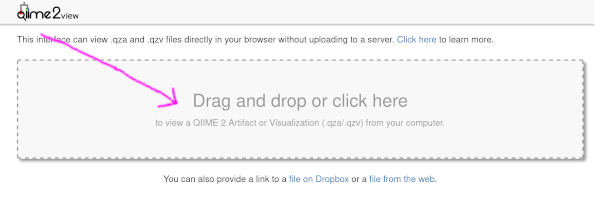
  2. right click on the 3D animation to open the context menu 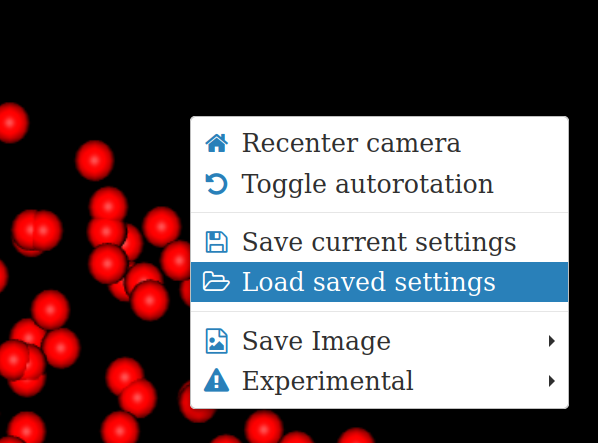
  3. choose `Load saved settings` and select the file `EmperorSettings/emp_settings_gut_panelA.json`
  
This is a screenshot of how your browser should render the interactive Emperor plot:
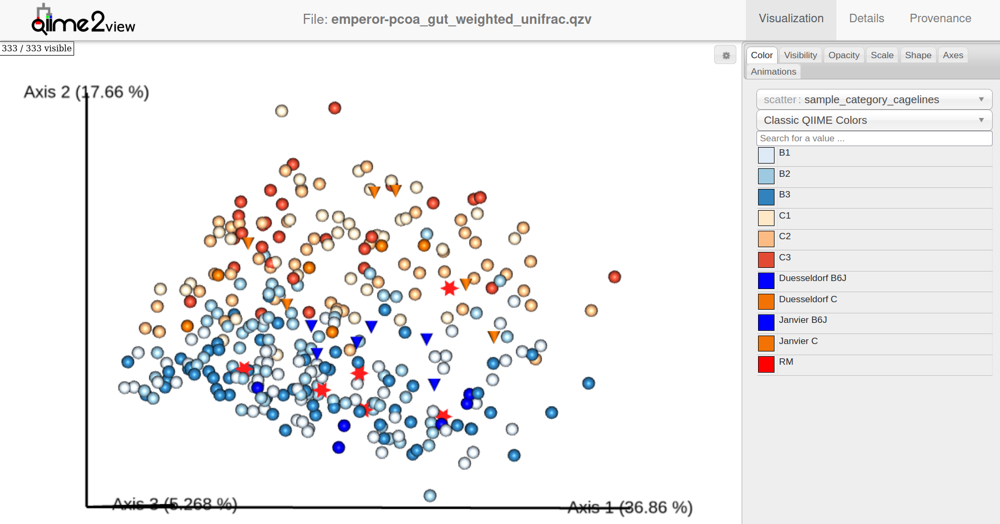

### Panel B
see above, but load settings from file `EmperorSettings/emp_settings_gut_panelB.json`
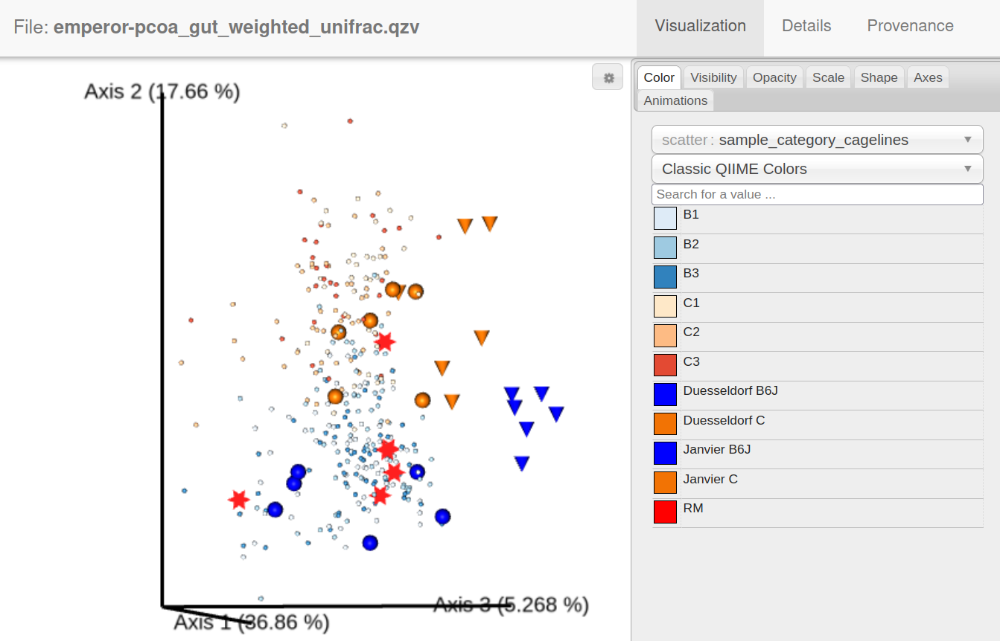

### Panel C
see above, but load settings from file `EmperorSettings/emp_settings_gut_panelC.json`
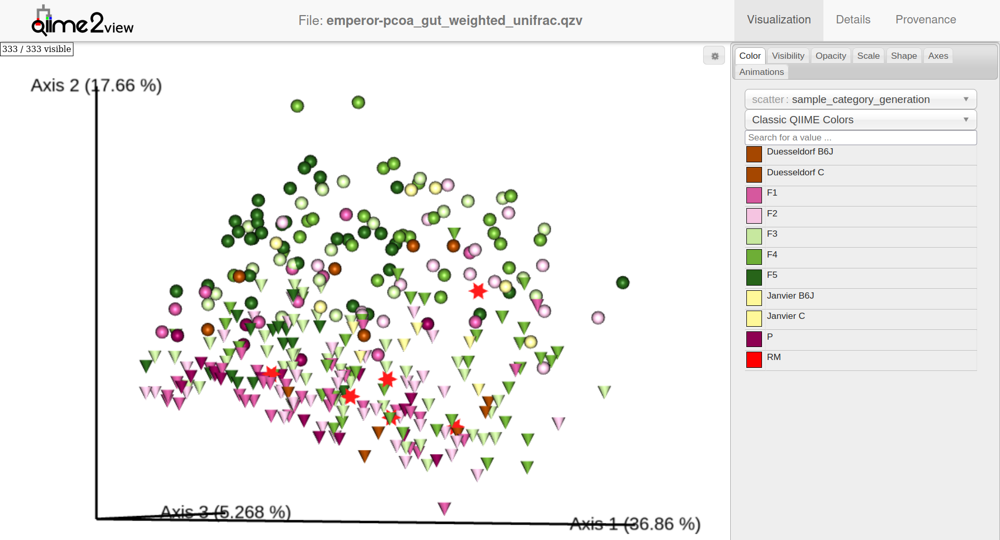

### Panel D
see above, but load settings from file `EmperorSettings/emp_settings_gut_panelD.json`
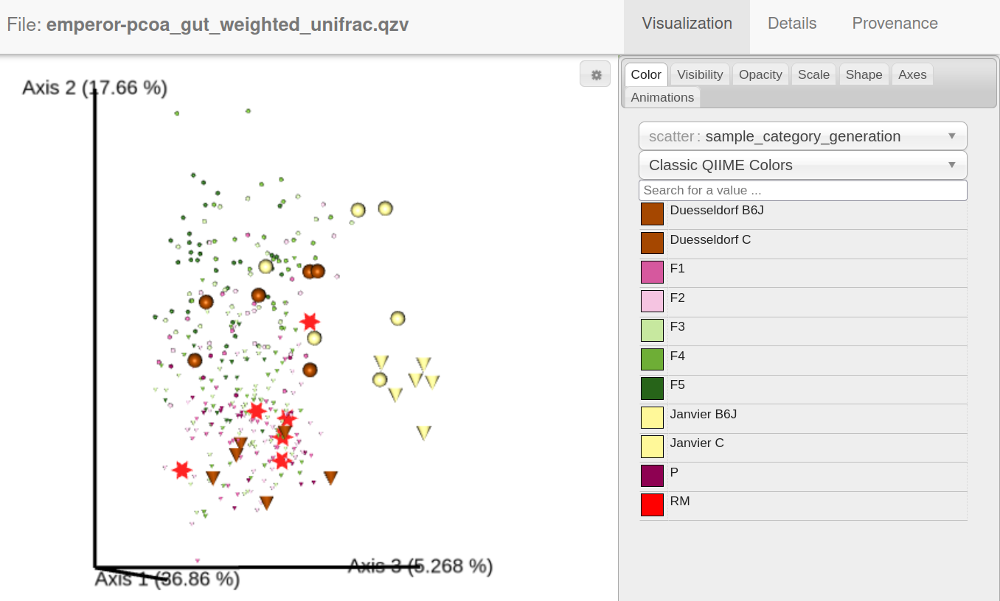

## Figure 3
### Panels A,B,C

In [17]:
def get_sample_numbers(meta):
    # collect number of samples: individuals, cages, cage_lines
    assert meta['host_subject_id'].value_counts().max() == 1
    
    numSamples = pd.concat([
        # breeding experiment
        pd.concat([
            meta.groupby(['generation', 'host_genotype']).size().rename('i'),  # individuals
            meta.groupby(['generation', 'host_genotype'])['cage_id'].unique().apply(len).rename('c'),  # cages
            meta.groupby(['generation', 'host_genotype'])['cage_line'].unique().apply(len).rename('l')  # cage-lines
        ], axis=1),
        # controls
        pd.concat([
            meta[pd.isnull(meta['generation'])].groupby(['geo_loc_name', 'host_genotype']).size().rename('i'),  # individuals
            meta[pd.isnull(meta['generation'])].groupby(['geo_loc_name', 'host_genotype'])['sex'].unique().apply(len).rename('c'),  # cages. Use sex as a proxy as we actually don't know the cage IDs
            meta[pd.isnull(meta['generation'])].groupby(['geo_loc_name', 'host_genotype'])['cage_line'].unique().apply(lambda x: np.nan).rename('l')  # we did not use cage lines for controls
        ], axis=1)
    ])
    
    return numSamples

def get_sample_label(grp, numSamples, genotypes=ORDER_GENOTYPE, justI=False):
    label = ""
    if grp == 'RM':
        genotypes = ['RM']
    for genotype in genotypes:
        cat = dict()
        for category in ['i','c','l']:
            number = numSamples.loc[(grp, genotype), category]
            if pd.notnull(number):
                cat[category] = '%2i%s' % (number, category)
            else:
                cat[category] = number
        if justI:
            ns = '%s' % cat['i']
        else:
            if pd.isnull(cat['l']):
                ns = '%s (%s)' % (cat['i'], cat['c'])
            else:
                ns = '%s (%s,%s)' % (cat['i'], cat['c'], cat['l'])
        label += "\n" + ns
    return label

def compute_beta_distances(res_beta, meta, metric='weighted_unifrac'):
    results = dict()

    dm = res_beta[metric].to_data_frame()
    data = []
    for refgrp, g_ref in meta[~meta['sample_category'].isin(['C'])].groupby('sample_category'):
        for (host_genotype, generation), g in meta[meta['sample_category'].isin(['C','B6J','RM'])].groupby(['sample_category', 'generation']):
            subset_g_ref = g_ref
            if refgrp == host_genotype:
                continue
            if refgrp == 'B6J':
                subset_g_ref = g_ref[g_ref['generation'] == generation]
            assert len(set(subset_g_ref.index) & set(g.index)) == 0
            d = dm.loc[subset_g_ref.index, g.index].stack().to_frame().reset_index().rename(columns={0: metric, 'level_0': 'idx_reference', 'level_1': 'idx_sample'})
            d['generation'] = generation
            d['host_genotype'] = host_genotype
            d['reference'] = refgrp
            d['reference_host_genotype'] = refgrp.split()[-1]
            d['reference_host_geolocname'] = refgrp.split()[0]
            data.append(d)
    results['beta'] = pd.concat(data).sort_values(by='generation', key=KEY_GENERATIONS)
    
    cids = [cid for (cid, size) in meta.groupby('cage_id').size().items() if size > 1]
    subset = meta[meta['cage_id'].isin(cids)]
    results['intra_cage'] = {'num_cages': len(cids),
                             'sum_mice': subset.shape[0],
                             'avg_mice_per_cage': subset.groupby('cage_id').size().mean(),
                             'avg_%s' % metric: np.mean([dm.loc[a,b] for cage_id, g in subset.groupby('cage_id') for (a,b) in combinations(g.index, 2)])}

    distances = []
    for (generation, host_genotype, cage_line), g in meta.groupby(['generation', 'host_genotype', 'cage_line']):
        for (cageA, cageB) in combinations(g['cage_id'].unique(), 2):
            d = dm.loc[g[g['cage_id'] == cageA].index, g[g['cage_id'] == cageB].index].stack().reset_index().rename(columns={0: metric})
            d[['generation', 'host_genotype', 'cage_line']] = [generation, host_genotype, cage_line]
            distances.append(d)
    distances = pd.concat(distances)
    results['intra_cage_line'] = {'num_cages': meta.groupby(['generation', 'host_genotype', 'cage_line'])['cage_id'].unique().apply(len).sum(),
                                  'avg_cages': meta.groupby(['generation', 'host_genotype', 'cage_line'])['cage_id'].unique().apply(len).mean(),
                                  'sum_mice_mice': distances.shape[0],
                                  'avg_mice_mice': distances.groupby(['generation', 'host_genotype', 'cage_line']).size().mean(),
                                  'avg_%s' % metric: distances[metric].mean(),
                                 }
    return results


def draw_temporals(res, meta, 
                   METRIC_BETA = 'weighted_unifrac', 
                   ALPHA_LIM = (14.5,21.8), 
                   BETA_LIM=(0.085,0.169),
                   title='gut microbiome'):
    #sns.set_style("white")
    numSamples = get_sample_numbers(meta)
    metric = 'PD_whole_tree'
    
    alpha = meta.merge(res['alpha_diversity']['results'], left_index=True, right_index=True)
    beta = compute_beta_distances(res['beta_diversity']['results'], meta, METRIC_BETA)

    sns.reset_orig()
    fig, axes = plt.subplots(3, 3, figsize=(15*1.4, 15), gridspec_kw={'width_ratios': [1, 6, 2]})
    fig.subplots_adjust(wspace=0)

    sns.boxplot(data=alpha[alpha['generation'] == 'RM'],
                y=metric, x='host_genotype',
                ax=axes[0,0], color=alpha_blending(COLORS['RM'], 0.4), width=0.4)
    sns.swarmplot(data=alpha[alpha['generation'] == 'RM'],
                  y=metric, x='host_genotype', 
                  ax=axes[0,0], color=COLORS['RM'], size=8, linewidth=1, edgecolor='white')


    data = alpha[(pd.notnull(alpha['generation'])) & (alpha['generation'] != 'RM')].sort_values(by='generation', key=KEY_GENERATIONS)
    sns.lineplot(data=data,
                 y=metric, x='generation', hue='host_genotype', 
                 ax=axes[0,1],sort=False, palette=COLORS, markers=True, marker="o")

    annotator = Annotator(axes[0,1], [
            ((generation, 'B6J'), (generation, 'C')) for generation in data['generation'].unique()
        ], data=data, y=metric, hue='host_genotype', x='generation')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()


    ax = axes[0,2]
    data = alpha[pd.isnull(alpha['generation'])]
    sns.boxplot(data=data,
                y=metric, x='geo_loc_name', hue='host_genotype', 
                ax=axes[0,2], palette={n:alpha_blending(c,0.4) for n,c in COLORS.items()}, hue_order=ORDER_GENOTYPE)
    sns.swarmplot(data=data,
                  y=metric, x='geo_loc_name', hue='host_genotype', 
                  ax=axes[0,2], palette=COLORS, dodge=True, size=8, linewidth=1, edgecolor='white', hue_order=ORDER_GENOTYPE)
    annotator = Annotator(axes[0,2], [
            (('Duesseldorf', 'B6J'), ('Duesseldorf', 'C')),
            (('Janvier', 'B6J'), ('Janvier', 'C'))
        ], data=data, y=metric, hue='host_genotype', x='geo_loc_name')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # ignore warning, as we do not split data into hue category
        annotator = Annotator(axes[0,2], [
                    ('Duesseldorf', 'Janvier')
                ], data=data, y=metric, x='geo_loc_name')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()

    axes[0,1].add_artist(ConnectionPatch(xyA=(1,ALPHA_LIM[0]+1), xyB=(0,ALPHA_LIM[0]+1), coordsA="data", coordsB="data",
                          axesA=axes[0,0], axesB=axes[0,1], color="black"))
    axes[0,0].text(0, ALPHA_LIM[0]+0.7, "p=%.3f" % kruskal(alpha[alpha['generation'] == 'RM'][metric], alpha[(alpha['generation'] == 'P')][metric]).pvalue)



    # figure aestetics
    axesTop = [axes[0,i].twiny() for i in range(len(axes[0]))]
    axesTop[0].set_xticks([0.5], ['%s\n\n' % get_sample_label('RM', numSamples)])
    axesTop[1].set_xlim(axes[0,1].get_xlim())
    axesTop[1].set_xticks(axes[0,1].get_xticks())
    axesTop[1].set_xticklabels(['\n%s' % get_sample_label(t.get_text(), numSamples) for t in axes[0,1].get_xticklabels()])
    axesTop[2].set_xlim(axes[0,2].get_xlim())
    offset = 0.2
    axesTop[2].set_xticks([0-offset,0+offset, 1-offset, 1+offset], 
                          ['\n%s\n' % get_sample_label('Duesseldorf', numSamples, genotypes=['B6J']),
                           '\n\n%s' % get_sample_label('Duesseldorf', numSamples, genotypes=['C']),
                           '\n%s\n' % get_sample_label('Janvier', numSamples, genotypes=['B6J']),
                           '\n\n%s' % get_sample_label('Janvier', numSamples, genotypes=['C'])])

    axes[0,2].set_title('Controls')
    axes[0,2].legend().remove()
    for ax in axes[0]:
        # same y limits for all three subplots
        ax.set_ylim(ALPHA_LIM)
        # add horizontal grid lines ...
        ax.set_axisbelow(True)
        # ... behind the plots
        ax.grid(axis='y')
        # no x axis label, as we already have tick labels
        ax.set_xlabel("")

        if ax == axes[0,0]:
            # nice label for Y axis
            ax.set_ylabel('α diversity\n%s' % DM_NAMES.get(metric))
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

           
    ## SECOND ROW: beta diversity distances to RM
    for ax in [axes[1,0], axes[1,1]]:
        ax.axhline(y=beta['intra_cage']['avg_%s' % METRIC_BETA], linestyle='--', label='avg. intra cage', color=sns.color_palette()[7])
        ax.axhline(y=beta['intra_cage_line']['avg_%s' % METRIC_BETA], linestyle='dotted', label='avg. intra cage linege', color=sns.color_palette()[5])

    axes[1,1].text(0.2, beta['intra_cage']['avg_%s' % METRIC_BETA]*1.02, '%ic (Σ %ii, Ø %.1fi)' % (
        beta['intra_cage']['num_cages'], 
        beta['intra_cage']['sum_mice'], 
        beta['intra_cage']['avg_mice_per_cage']))
    axes[1,1].text(3.2, beta['intra_cage_line']['avg_%s' % METRIC_BETA]*1.02, 'Σ %ic-c, Ø %.1fc-c  Σ %ii-i, Ø %.1fi-i' % (
        beta['intra_cage_line']['num_cages'], 
        beta['intra_cage_line']['avg_cages'], 
        beta['intra_cage_line']['sum_mice_mice'],
        beta['intra_cage_line']['avg_mice_mice']))

    data = beta['beta'][beta['beta']['reference'] == 'RM']
    sns.lineplot(data=data, y=METRIC_BETA, x='generation', hue='host_genotype', ax=axes[1,1], sort=False, palette=COLORS, markers=True, marker="o", hue_order=ORDER_GENOTYPE)
    
    annotator = Annotator(axes[1,1], [
        ((generation, 'B6J'), (generation, 'C')) for generation in data['generation'].unique()
        ], data=data, y=METRIC_BETA, hue='host_genotype', x='generation')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()
    data = beta['beta'][beta['beta']['reference'] == 'B6J']
    sns.lineplot(data=data, y=METRIC_BETA, x='generation', ax=axes[1,1], sort=False, markers=True, marker="o", color='green', label='CG')

    axes[1,1].set_ylabel("")
    axes[1,1].legend().remove()
    
    idx_perm = meta[meta['generation'].isin(['RM', 'P'])].index
    res_perm = permanova(res['beta_diversity']['results'][METRIC_BETA].filter(idx_perm), meta.loc[idx_perm,:], column='generation')
    axes[1,1].add_artist(ConnectionPatch(xyA=(0.5, np.mean(list(BETA_LIM))), xyB=(0, np.mean(list(BETA_LIM))), coordsA="data", coordsB="data",
                      axesA=axes[1,0], axesB=axes[1,1], color="black"))
    axes[1,0].text(0, np.mean(list(BETA_LIM)), "PERMANOVA p=%.3f" % res_perm['p-value'], horizontalalignment="center")


    for ax in axes[1]:
        # same y limits for all three subplots
        ax.set_ylim(BETA_LIM)
        # add horizontal grid lines ...
        ax.set_axisbelow(True)
        # ... behind the plots
        ax.grid(axis='y')
        ax.set_xlabel("")

    axes[1,1].set_yticklabels([])
    for i in [1,2]:
        axes[i,0].set_ylabel('β diversity\n%s' % DM_NAMES.get(METRIC_BETA))
    axes[1,0].set_xticks([0.5], ["RM"])
    axes[1, 2].axis('off')


    ## THIRD ROW: beta diversity distances to Controls
    markers_control = {'Janvier': '^', 'Duesseldorf': 'o'}
    data = beta['beta'][~beta['beta']['reference'].isin(['B6J','RM']) & 
                        (beta['beta']['generation'] == 'RM')]
    #sns.lineplot(data=data, y=METRIC_BETA, x='generation', hue='reference_host_genotype', sort=False, ax=axes[2,0], marker="o", style='reference_host_geolocname', palette=COLORS)
    sns.lineplot(data=data, y=METRIC_BETA, x='generation', hue='reference_host_genotype', sort=False, ax=axes[2,0], markers=markers_control, style='reference_host_geolocname', style_order=['Duesseldorf', 'Janvier'], palette=COLORS)
    #sns.boxplot(data=data, y=METRIC_BETA, hue='reference_host_genotype', ax=axes[2,0], x='reference_host_geolocname', palette={n:alpha_blending(c,0.4) for n,c in COLORS.items()}, hue_order=ORDER_GENOTYPE)
    
    for (location, host_genotype), g in data.groupby(['reference_host_geolocname', 'reference_host_genotype']):
        axes[2,0].text(0.0, g[METRIC_BETA].mean(), get_sample_label(location, numSamples, genotypes=[host_genotype]), horizontalalignment='right')
    
    axes[2,0].legend().remove()
    axes[2,0].set_xlim((-1,1))
    for location, g in data.groupby('reference_host_geolocname'):
        #axes[2,0].text(0.01, 0.115 if location == 'Duesseldorf' else 0.145, 'p=%.3f' % kruskal(
        axes[2,0].text(0.01, g[METRIC_BETA].mean(), 'p=%.3f' % kruskal(
            g[(g['reference_host_genotype'] == 'B6J')][METRIC_BETA],
            g[(g['reference_host_genotype'] == 'C')][METRIC_BETA]).pvalue)

    data = beta['beta'][~beta['beta']['reference'].isin(['B6J','RM']) & 
                        (beta['beta']['reference'].apply(lambda x: x.split()[-1]) == beta['beta']['host_genotype'])]
    sns.lineplot(data=data, y=METRIC_BETA, x='generation', hue='reference_host_genotype', sort=False, ax=axes[2,1], markers=markers_control, style='reference_host_geolocname', style_order=['Duesseldorf', 'Janvier'], palette=COLORS)
    axes[2,1].legend().remove()
    
    for ax in axes[2]:
        # same y limits for all three subplots
        ax.set_ylim(BETA_LIM)
        # add horizontal grid lines ...
        ax.set_axisbelow(True)
        # ... behind the plots
        ax.grid(axis='y')
        if ax == axes[2,1]:
            ax.set_xlabel("Generations")
        else:
            ax.set_xlabel("")
    axes[2, 1].set_yticklabels([])

    axes[2, 1].set_ylabel("")
    axes[2, 2].axis('off')
    
    # legend for alpha diversity
    axes[0,1].legend(handles=[
        Line2D([0], [0], marker='o', color=COLORS['RM'], label='RM', linestyle=''),
        Line2D([0], [0], marker='o', color=COLORS['B6J'], label='B6J'),
        Line2D([0], [0], marker='o', color=COLORS['C'], label='C'),
        ],
        title='α diversity', loc='upper left')

    # legend for distance to RM
    axes[1,2].legend(handles=[
        Line2D([0], [0], color=sns.color_palette()[7], label='avg. intra cage', linestyle='--'),
        Line2D([0], [0], color=sns.color_palette()[5], label='avg. intra cage lineage', linestyle='dotted'),
        Line2D([0], [0], marker='o', color=COLORS['B6J'], label='Δ(RM, B6J)'),
        Line2D([0], [0], marker='o', color=COLORS['C'], label='Δ(RM, C)'),
        Line2D([0], [0], marker='o', color='green', label='Δ(B6J, C)'),
        ],
        title='β distance to RM', loc='center')

    # legend for distance to Controls
    axes[2,2].legend(handles=[
        Line2D([0], [0], marker=markers_control['Duesseldorf'], color=COLORS['B6J'], label='Δ(Duesseldorf B6J, RM or B6J)'),
        Line2D([0], [0], marker=markers_control['Duesseldorf'], color=COLORS['C'],   label='Δ(Duesseldorf C, RM or C)'),
        Line2D([0], [0], marker=markers_control['Janvier'], color=COLORS['B6J'], label='Δ(Janvier B6J, RM or B6J)', linestyle='dotted'),
        Line2D([0], [0], marker=markers_control['Janvier'], color=COLORS['C'],   label='Δ(Janvier B6J, RM or C)', linestyle='dotted')],
        title='β distances to Controls', loc='center')

    plt.figtext(0.09, 0.87, 'A', fontsize=16)
    plt.figtext(0.09, 0.6, 'B', fontsize=16)
    plt.figtext(0.09, 0.33, 'C', fontsize=16)
    
    fig.suptitle(title)
    
    return fig

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F1_C vs. F1_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.215e-03 U_stat=6.400e+01
P_C vs. P_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.529e-02 U_stat=1.800e+01
F2_C vs. F2_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.450e-03 U_stat=1.800e+02
F3_C vs. F3_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.238e-08 U_stat=8.400e+01
F4_C vs. F4_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.248e-04 U_stat=2.590e+02
F5_C vs. F5_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.412e-01 U_stat=2.190e+02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-

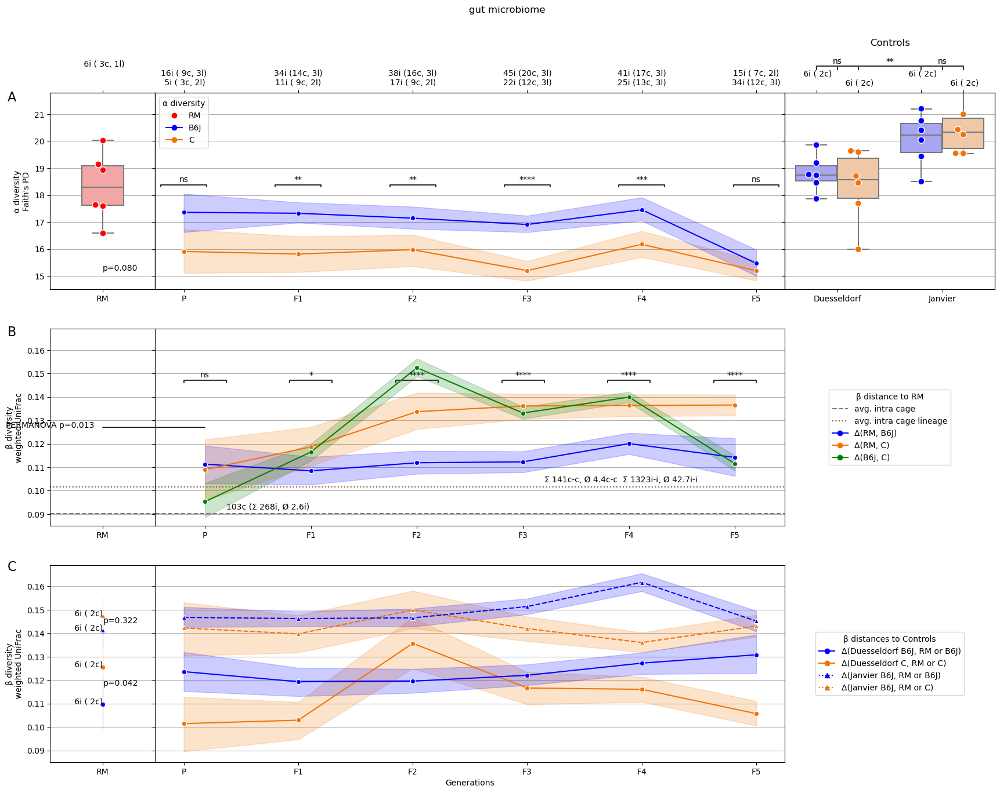

In [18]:
%matplotlib inline
fig = draw_temporals(res_gut, meta_gut)

### Panel D

In [19]:
def _get_maternal_type(row):
    if row['host_genotype_dam'] != row['host_genotype_offspring']:
        return 'other genotype'
    elif row['host_genotype_dam'] == 'Unknown':  # only for source tracker
        return 'Unknown'
    else:
        if row['cage_line_dam'] == row['cage_line_offspring']:
            return 'true dams'
        elif (row['generation_dam'] == 'F2') and (row['generation_offspring'] == 'F3') and \
             (row['cage_line_dam']  == 'C2') and (row['cage_line_offspring']  == 'C3'):
            return 'true dams'
        else:
            return 'other cage lineage'
        raise ValueError("should not happen")

def compute_maternalLegacy(meta, res_beta, metric):
    dm = res_beta['results'][metric].to_data_frame()

    dists = []
    for (genP, genO) in zip(ORDER_GENERATIONS[1:-1], ORDER_GENERATIONS[2:-1]):
        idx_dams = meta[(meta['generation'] == genP) & (meta['gave_birth'] == True)].index
        idx_offspring = meta[(meta['generation'] == genO)].index
        assert(len(set(idx_dams) & set(idx_offspring)) == 0)

        dist = dm.loc[idx_dams, idx_offspring].stack().reset_index().rename(
            columns={'level_0': 'dam', 'level_1': 'offspring', 0: metric}).merge(
                meta[['generation', 'cage_line', 'host_genotype']], left_on='dam', right_index=True, how='left').merge(
                meta[['generation', 'cage_line', 'host_genotype']], left_on='offspring', right_index=True, how='left', suffixes=('_dam', '_offspring'))
        dist['maternal'] = dist.apply(_get_maternal_type, axis=1)
        dists.append(dist)
    dists = pd.concat(dists)

    return {'dists': dists, 
            'sample_numbers': dists.groupby(['generation_offspring','host_genotype_offspring','maternal']).size()}

def draw_maternalLegacy(meta, res_beta, metric='unweighted_unifrac'):
    data = compute_maternalLegacy(meta, res_beta, metric)
    dists = data['dists']
    nums = data['sample_numbers']
    
    fig, axes = plt.subplots(1, 2, figsize=(1.9*len(dists['generation_offspring'].unique()),5), sharey=True)
    fig.subplots_adjust(wspace=0)

    order_hue = ['true dams', 'other cage lineage', 'other genotype']

    for (ax, (host_genotype, g)) in zip(axes, list(dists.groupby('host_genotype_offspring'))):
        sns.boxplot(data=g, y=metric, x='generation_offspring', ax=ax, hue='maternal', hue_order=order_hue, palette={'other cage lineage': 'lightgray',
                                                                                                                     'other genotype': 'green',
                                                                                                                     'true dams': COLORS[host_genotype]})
        axTop = ax.twiny()
        axTop.set_xlim(ax.get_xlim())
        axTop.set_xticks(ax.get_xticks(), ['%ii-i\n%ii-i\n%ii-i' % ( 
                                               nums.loc[t.get_text(), host_genotype, 'true dams'],
                                               nums.loc[t.get_text(), host_genotype, 'other cage lineage'],
                                               nums.loc[t.get_text(), host_genotype, 'other genotype'],
                                         ) 
                                  for t in ax.get_xticklabels()])
        ax.legend().set_title("")

        annotator = Annotator(ax, 
            [((cat, 'true dams'), (cat, 'other cage lineage')) for cat in g['generation_offspring'].unique()] + \
            [((cat, 'other genotype'), (cat, 'other cage lineage')) for cat in g['generation_offspring'].unique()], 
            data=g, y=metric, x='generation_offspring', hue='maternal', hue_order=order_hue)
        annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
        _ = annotator.apply_and_annotate()

        ax.set_xlabel("")
        if host_genotype == 'B6J':
            ax.set_ylabel('β diversity\n%s' % DM_NAMES.get(metric))
        else:
            ax.set_ylabel("")
            ax.legend().remove()
        ax.text(0, ax.get_ylim()[0]*1.2, host_genotype)
    plt.figtext(0.09, 0.89, 'D', fontsize=16)
    return fig

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F3_true dams vs. F3_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.289e-08 U_stat=4.827e+03
F4_true dams vs. F4_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.116e-18 U_stat=2.192e+03
F5_true dams vs. F5_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.323e-11 U_stat=1.090e+02
F2_other cage lineage vs. F2_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.920e-39 U_stat=5.040e+02
F3_other cage lineage vs. F3_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.274e-20 U_stat=1.180e+04
F4_other cage lineage vs. F4_other genotype: Mann-Whitney-Wilcoxon test two-sid

/homes/sjanssen/Git/trevismd/statannotations/statannotations/Annotator.py:550: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.draw()


F3_other cage lineage vs. F3_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.261e-07 U_stat=1.623e+03
F4_other cage lineage vs. F4_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.002e-10 U_stat=4.016e+03
F5_other cage lineage vs. F5_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.191e-20 U_stat=5.656e+03
F1_true dams vs. F1_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.185e-01 U_stat=1.990e+02
F2_true dams vs. F2_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.380e-02 (ns) U_stat=2.150e+02
F1_other cage lineage vs. F1_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.137e-05 U_stat=2.700e+02


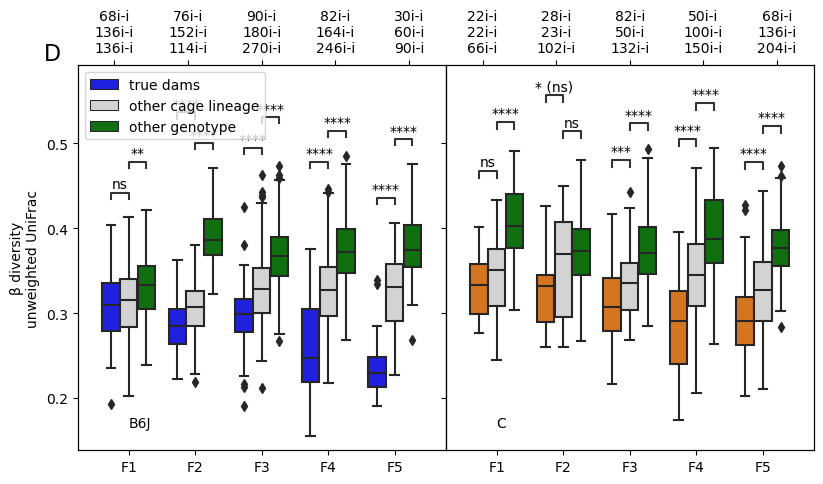

In [20]:
%matplotlib inline
fig = draw_maternalLegacy(meta_gut, res_gut['beta_diversity'], metric='unweighted_unifrac')

### Panel E

In [21]:
def compute_maternalLegacy_sourcetracker(meta, rawcounts):
    dists = []
    for (genP, genO) in zip(ORDER_GENERATIONS[1:-1], ORDER_GENERATIONS[2:-1]):
        meta_dams = meta[(meta['generation'] == genP) & (meta['gave_birth'] == True)].copy()
        meta_offspring = meta[(meta['generation'] == genO)].copy()
        assert(len(set(meta_dams.index) & set(meta_offspring.index)) == 0)

        meta_dams['st2_type'] = 'Source'
        meta_dams['st2_env'] = meta_dams.index
        meta_offspring['st2_type'] = 'Sink'
        meta_offspring['st2_env'] = np.nan
        
        meta_st = pd.concat([meta_dams[['st2_type', 'st2_env']],
                             meta_offspring[['st2_type', 'st2_env']]])
        
        res_st2 = sourcetracker2(rawcounts, meta_st, col_envname='st2_env', col_type='st2_type', dry=False, wait=False)        
        if res_st2['results'] is not None:
            dist = res_st2['results'].stack().reset_index().rename(
                columns={'Source': 'dam', 'Sink': 'offspring', 0: 'impact'}).merge(
                    meta[['generation', 'cage_line', 'host_genotype']], left_on='dam', right_index=True, how='left').merge(
                    meta[['generation', 'cage_line', 'host_genotype']], left_on='offspring', right_index=True, how='left', suffixes=('_dam', '_offspring'))
            dist['maternal'] = dist.apply(_get_maternal_type, axis=1)
            dists.append(dist)
    if len(dists) > 0:
        dists = pd.concat(dists)
    return dists

def draw_maternalLegacy_sourcetracker(meta, rawcounts):
    res_st = compute_maternalLegacy_sourcetracker(meta, rawcounts)
    
    fig, axes = plt.subplots(1, 2, figsize=(1.25*10, 5), sharey=True)
    fig.subplots_adjust(wspace=0)

    hue_order = ['other cage lineage', 'true dams']
    numSamples = res_st[res_st['maternal'] != 'Unknown'].groupby(['host_genotype_offspring', 'generation_offspring', 'maternal']).size()

    for (ax, (host_genotype, g)) in zip(axes, res_st.groupby('host_genotype_offspring')):
        data = g[g['maternal'] != 'Unknown']
        sns.boxplot(data=data, y='impact', x='generation_offspring', hue='maternal',
                    ax=ax, palette={'true dams': COLORS[host_genotype], 'other cage lineage': 'lightgray'},
                    hue_order=hue_order)

        annotator = Annotator(ax, [
                ((generation, 'true dams'), (generation, 'other cage lineage')) for generation in g['generation_offspring'].unique()
            ], data=data, y='impact', hue='maternal', x='generation_offspring', hue_order=hue_order)
        annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
        annotator.apply_and_annotate()


        if ax == axes[0]:
            ax.legend().set_title("")
        else:
            ax.legend().remove()
            ax.set_ylabel("")
        ax.set_xlabel("")
        ax.text(0, -0.205, host_genotype)

        axTop = ax.twiny()
        axTop.set_xlim(ax.get_xlim())
        axTop.set_xticks(ax.get_xticks(), 
                         ['\n'.join(['%ii-i' % numSamples.loc[(host_genotype, t.get_text(), maternal)]
                                     for maternal in reversed(hue_order)])
                          for t in ax.get_xticklabels()])
    return fig

Reduced to 55 samples (feature-table had 334, metadata had 55 samples)
Using existing results from '.anacache/dd30b740e9d6280223f761ff6b754fce.sourcetracker2'. 
Reduced to 64 samples (feature-table had 334, metadata had 64 samples)
Using existing results from '.anacache/cc67aaf84782927eb1f803610e2bf6f4.sourcetracker2'. 
Reduced to 79 samples (feature-table had 334, metadata had 79 samples)
Using existing results from '.anacache/e4d4350967d288185aebf04bf39dad14.sourcetracker2'. 
Reduced to 78 samples (feature-table had 334, metadata had 78 samples)
Using existing results from '.anacache/fd4775252436ffd24eefd602c5916c09.sourcetracker2'. 
Reduced to 61 samples (feature-table had 334, metadata had 61 samples)
Using existing results from '.anacache/1ceb6e7c08e2827dadb7c5c20b7eea63.sourcetracker2'. 


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_other cage lineage vs. F2_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.445e-04 U_stat=4.223e+03
F1_other cage lineage vs. F1_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.553e-01 U_stat=4.551e+03
F3_other cage lineage vs. F3_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.607e-03 U_stat=6.339e+03
F4_other cage lineage vs. F4_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.451e-14 U_stat=2.797e+03
F5_other cage lineage vs. F5_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.358e-04 U_stat=4.950e+02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
   

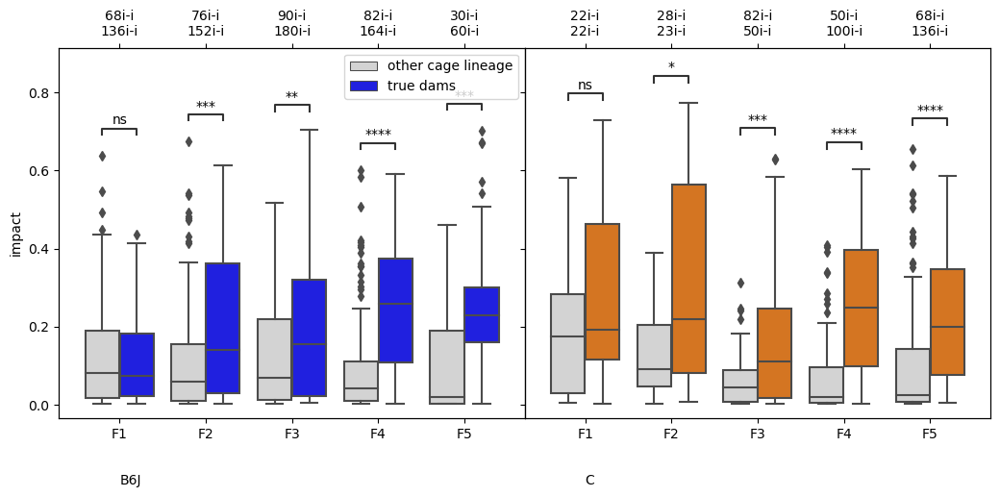

In [22]:
%matplotlib inline
fig = draw_maternalLegacy_sourcetracker(meta_gut, res_gut['counts_plantsremoved'])

### Panel F

In [23]:
ENAPROJECT = 'PRJEB28381'

prj_robertson = dict()
prj_robertson['paths'] = dict()

#### Download SRA metadata for Robertson samples
Interestingly, it was easier to obtain metadata from NCBI than from ENA for us. Here is how we did it.
  1. Browse to `https://www.ncbi.nlm.nih.gov/search/all/?term=PRJEB28381`
  2. Select the 346 `SRA` "hits", not the single BioProject: 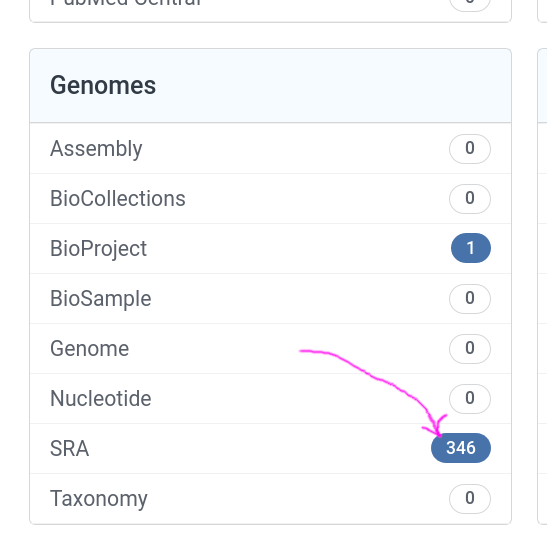
  3. In the resulting list page, hit `send to`, select `Run selector` as "format" and hit `go` 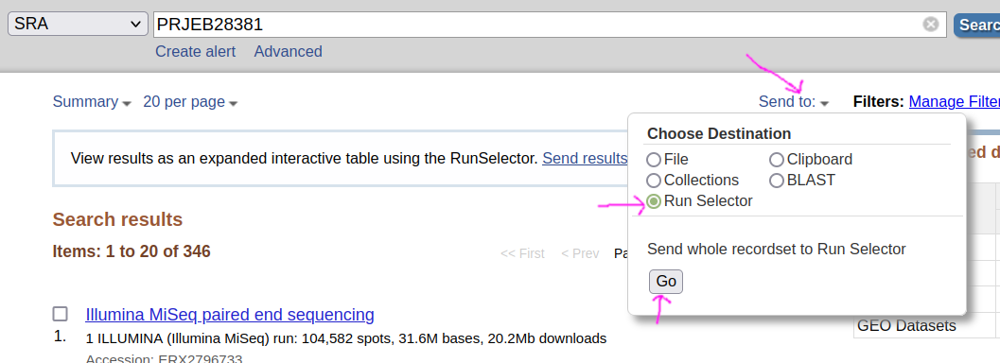
  4. Hit `metadata` and store the according text file `SraRunTable.txt` in `Incoming`: 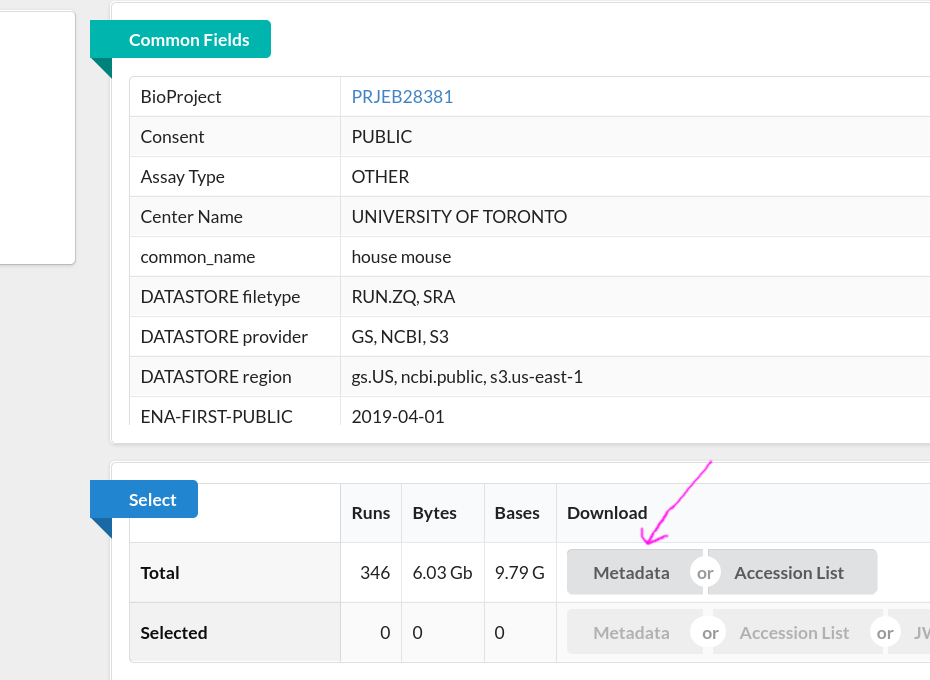 (we also provide this file through our repository)

#### Normalize Robertson's metadata

In [24]:
meta_robertson = pd.read_csv('Incoming/SraRunTable.txt', sep=",", index_col=0).rename(
    columns={'common_name': 'host_common_name',
             'Organism': 'host_scientific_name'})[[
    'host_common_name',
    'host_scientific_name',
    'Sample_name',
    'Sample Name',
    'sex',
    'Submitter_Id',  
]]

# obtain host body site as last character in sample name
meta_robertson['host_body_site'] = meta_robertson['Sample_name'].apply(lambda x: {
    'C': 'uberon:colon',
    'I': 'uberon:ileum',
    'P': 'uberon:feces'}.get(x.split('.')[-1][0]))

meta_robertson['sample_type'] = meta_robertson['host_body_site'].apply(
    lambda x: 'feces' if x == 'uberon:feces' else 'colon content')
meta_robertson['host_genotype'] = 'c57bl6'
meta_robertson['qiita_study_id'] = 'Robertson'
meta_robertson['host_scientific_name'] = meta_robertson['host_scientific_name'].apply(str.lower)

# derive experiment from Sample_name, i.e. if name starts with 'CH' = 'co-housing', if starts 
# with either Js or Ts = 'sentinels' and all others are 'littermates'
def _get_experiment(row):
    if row['Sample_name'].startswith('CH'):
        return 'co-housing'
    if row['Sample_name'].startswith('Js') or row['Sample_name'].startswith('Ts'):
        return 'sentinels'
    return 'littermates'
meta_robertson['experiment'] = meta_robertson.apply(_get_experiment, axis=1)

# derive generation from Sample_name:
# 1) all sentinels are of generation P1, by definition
# 2) all co-housing animals are of generation F2, by definition
# 3) F2 generation samples of littermates are flagges by ".F2." in the sample name
meta_robertson.loc[meta_robertson[meta_robertson['experiment'] == 'sentinels'].index, 'generation'] = 'P1'
meta_robertson.loc[meta_robertson[meta_robertson['experiment'] == 'co-housing'].index, 'generation'] = 'F2'
meta_robertson.loc[meta_robertson[(meta_robertson['experiment'] == 'littermates') & 
                   meta_robertson['Sample_name'].apply(lambda x: '.F2.' not in x)].index, 'generation'] = 'F1'
meta_robertson.loc[meta_robertson[(meta_robertson['experiment'] == 'littermates') & 
                                  (pd.isnull(meta_robertson['generation']))].index, 'generation'] = 'F2'

# derive vendor from Sample_name:
meta_robertson.loc[
    meta_robertson[meta_robertson['experiment'] == 'sentinels'].index, 
    'vendor'] = meta_robertson[meta_robertson['experiment'] == 'sentinels']['Sample_name'].apply(
        lambda x: {'T': 'mTAC', 'J': 'mJAX'}.get(x[0]))
meta_robertson.loc[
    meta_robertson[meta_robertson['experiment'] == 'co-housing'].index, 
    'vendor'] = meta_robertson[meta_robertson['experiment'] == 'co-housing']['Sample_name'].apply(
        lambda x: 'mJAX' if '.JAX' in x else 'mTAC')
meta_robertson.loc[
    meta_robertson[meta_robertson['experiment'] == 'littermates'].index, 
    'vendor'] = meta_robertson[meta_robertson['experiment'] == 'littermates']['Sample_name'].apply(
        lambda x: 'mJAX' if x.startswith('J.T.') else 'mTAC')

# derive "litter" from Sample_name for littermates experiment
meta_robertson.loc[
    meta_robertson[(meta_robertson['experiment'] == 'littermates')].index, 
    'litter'] = meta_robertson[(meta_robertson['experiment'] == 'littermates')]['Sample_name'].apply(
        lambda x: x.split('.')[-2])

meta_robertson['sample_title'] = meta_robertson['experiment'].apply(
    lambda x: {'co-housing': "co-housed",
               'littermates': "littermate",
               'sentinels': "sentinel"}.get(x,x))
meta_robertson.loc[meta_robertson[(meta_robertson['experiment'] == 'co-housing') & 
                                  (meta_robertson['Sample_name'].apply(lambda x: x[3] == 's'))].index, 
                   'sample_title'] = 'non-co-housed'

# question by Stefan Janssen: 
# "In your metadata file, I do find 12 JAX and 13 TAC colon f2 littermate samples. It might be too hard to see, 
#  but in the supplemental Figure S6, I can only spot ~8 samples, which is in line with the below table. 
#  Is it possible, that you re-sequenced some samples due to bad quality?"
#
# answer from Heather Maughan (group of Dana Philpott)
# "Litter 3 ended up being excluded from the F2 analyses reported in the paper, so the sample size ended up 
#  being 8-10 samples for each (not sure why Sue only had n=8 in the table). Clearly we uploaded Litter 3's 
#  sequence data so that is why there appears to be more sequenced samples than those reported in the paper. 
#
#  Litter 3 was excluded because their microbiotas were quite divergent from other litters and the parents, 
#  and because they were the last of the 3 subsequent litters (1, 2, then 3 from the same breeding pair), the
#  lab was concerned about confounding factors (perhaps breeder age? really it was unknown) affecting the 
#  microbiota."
idx_skip = meta_robertson.loc[(meta_robertson['experiment'] == 'littermates') & 
                  (((meta_robertson['vendor'] == 'mJAX') & (meta_robertson['litter'] == '3')) |
                   ((meta_robertson['vendor'] == 'mTAC') & (meta_robertson['litter'] == '4')))].index

# flip indices of 6 samples to resolve a sample swap, see below 
idx_tac = list(meta_robertson[meta_robertson['Sample_name'].isin(
    ['CH7sa.JAX3.2.%s' % bs for bs in ['C','I','P']])].index)
idx_jax = list(meta_robertson[meta_robertson['Sample_name'].isin(
    ['CH7sa.TAC3.2.%s' % bs for bs in ['C','I','P']])].index)
meta_robertson.index = [{new: old 
                         for (new, old) 
                         in zip(idx_tac+idx_jax, idx_jax+idx_tac)}.get(i, i) 
                        for i 
                        in meta_robertson.index]

meta_robertson['skip_sample'] = False
meta_robertson.loc[idx_skip, 'skip_sample'] = True

# append _1 to sample names to match with sequencing file names
meta_robertson.index = list(map(lambda x: x + '_1', meta_robertson.index))

**question by Stefan Janssen**:

"Here are six samples which seem to be undecided if they are TAX or JAX. Can you help me resolve this?
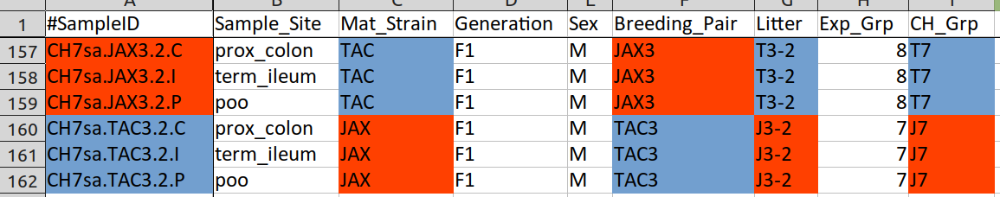

**answer from Heather Maughan (group of Dana Philpott)**:

Sue believed that these samples had been accidentally swapped during the extraction step; she changed the metadata but did not change sample names (because they are linked with the sequence read file names). However, it doesn’t
look like the “Breeding Pair” column was switched/updated. I fixed it in this screenshot. Does that make sense? 


**Note** the below steps require downloaded 2.6GB of sequencing data, trimming and ASV calling, which in total will take some time. Therefore, we host the resulting feature-table in our repositors: `Incoming/robertson-hit.biom`. This notebook will use this file by default to save the extra compute. Should you want to reproduce these steps yourself, simply delete this file!

In [25]:
prj_robertson['paths']['deblur_table'] = 'Incoming/robertson-hit.biom'

#### Download Robertson's sequencing data
1. Browse to `https://www.ebi.ac.uk/ena/browser/view/PRJEB28381`
2. identify the `Download All` button (make sure to use the correct button, i.e. NOT `Submitted files: FTP` nor `SRA files: FTP` as this will complicate sequence-data to metadata mapping): 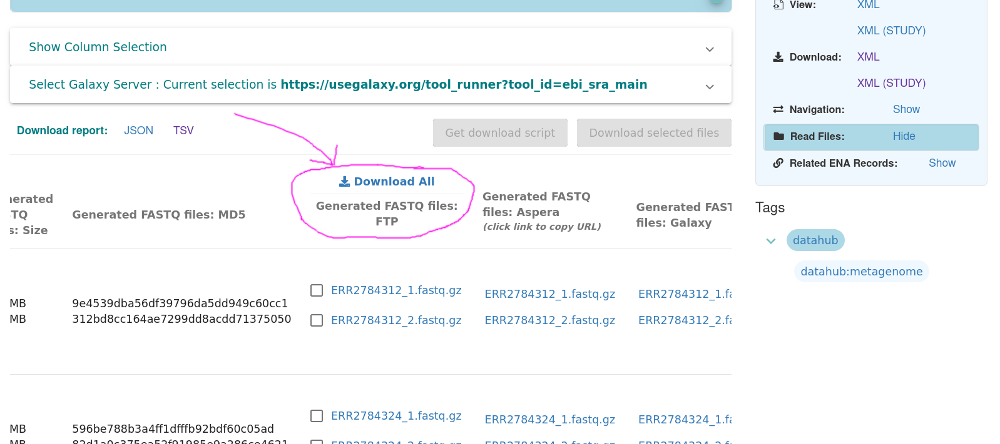
3. save the download script to obtain all forward and reverse sequncing files through `wget` (we also provide the resulting file at our repository `Incoming/ena-file-download-read_run-PRJEB28381-fastq_ftp-20231104-1013.sh`). Execution can be done in the following cell

In [26]:
if not os.path.exists(prj_robertson['paths']['deblur_table']):
    fp_dlscript = 'Incoming/ena-file-download-read_run-PRJEB28381-fastq_ftp-20231104-1013.sh'
    ena_file_cmds = !cat $fp_dlscript | grep "_1.fastq.gz"  # as we discard all reverse reads, there is no need to download them in the first place

    enadir = os.path.join('tmp_dir/no_backup/', ENAPROJECT)
    cluster_run([
        'export ftp_proxy="http://proxy.computational.bio.uni-giessen.de:3128"',
        'mkdir -p %s' % enadir, 'cd %s' % enadir] + ena_file_cmds, 'dl_ENA', os.path.join(enadir, last_ena_file),
        dry=False, ppn=1, use_grid=False)

#### Process Robertson's sequencing data
We are applying here the same pre-processing steps as with our own sequencing data, i.e.
  1. trimming primer sequences
  2. obtain 150nt long ASVs via Deblur

In [27]:
prj_robertson['metadata'] = meta_robertson
prj_robertson['paths']['demux'] = os.path.abspath('tmp_dir/no_backup/%s/' % ENAPROJECT)
prj_robertson['paths']['tmp_workdir'] = os.path.abspath('./tmp_dir/no_backup')
prj_robertson['paths']['Generated/Emperor'] = os.path.abspath('./Generated/Emperor')

In [28]:
if not os.path.exists(prj_robertson['paths']['deblur_table']):
    prj_robertson = project_trimprimers(
        "GTGCCAGCMGCCGCGGTAA", 
        "GGACTACHVGGGTWTCTAAT", prj_robertson, pattern_fwdfiles="*_1.fastq.gz", no_rev_seqs=True)

In [29]:
if not os.path.exists(prj_robertson['paths']['deblur_table']):
    prj_robertson = project_deblur(prj_robertson, pattern_fwdfiles="*_1.fastq.gz", ppn=32, pmem='2GB')

In [31]:
# this will produce an Bray-Curtis PCoA Emperor plot to only inspect the Robertson data
# we used this to find the above mentioned sample swap
rob_rare = rarefy(biom2pandas(prj_robertson['paths']['deblur_table']), rarefaction_depth=6000, dry=False)
if rob_rare['results'] is not None:
    rob_beta = beta_diversity(rob_rare['results'], metrics=['bray_curtis'], dry=False, wait=False)
    if rob_beta['results'] is not None:
        _ = emperor(meta_robertson, rob_beta['results'], fp_results='Generated/Emperor/', infix='_checkRob', dry=False, wait=False)

Using existing results from '.anacache/4dd8ab523245f11f44b61e5e22124d98.rarefy'. 
Using existing results from '.anacache/d5ca339cda9cbd0488903de9edd9a872.bdiv'. 
Using existing results from '.anacache/b04eeb068520e44357a376f8c496fc27.emperor'. 


In [32]:
# merge our and Robertson's metadata
meta_rob = pd.concat([meta_gut, prj_robertson['metadata']])
meta_rob

/homes/sjanssen/miniconda3/envs/notebookServer/lib/python3.10/site-packages/IPython/lib/pretty.py:778: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  output = repr(obj)
/homes/sjanssen/miniconda3/envs/notebookServer/lib/python3.10/site-packages/IPython/core/formatters.py:342: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return method()


,barcode,center_name,center_project_name,concentration_ng_myl,experiment_design_description,flowcell,i5_index,i5_index_id,i7_index,i7_index_id,...,generation_cageline,independent_cage_lineage,Sample_name,Sample Name,Submitter_Id,experiment,vendor,litter,sample_title,skip_sample
13422.1,CTCTCTAT,ZETT UKD,148,25,embryo transfer of two typical lab mice strain...,200721_M04304_0230_000000000-J7F5M,S502-A,CTCTCTAT,N701-A,TAAGGCGA,...,RM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13422.10,TATCCTCT,ZETT UKD,148,25,embryo transfer of two typical lab mice strain...,200721_M04304_0230_000000000-J7F5M,S503-A,TATCCTCT,N702-A,CGTACTAG,...,P_C2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13422.100,ACTGCATA,ZETT UKD,148,17,embryo transfer of two typical lab mice strain...,200721_M04304_0230_000000000-J7F5M,S506-B,ACTGCATA,N716-B,ACTCGCTA,...,F2_B3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13422.101,AAGGAGTA,ZETT UKD,148,25,embryo transfer of two typical lab mice strain...,200721_M04304_0230_000000000-J7F5M,S507-B,AAGGAGTA,N716-B,ACTCGCTA,...,F2_B3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13422.102,CTAAGCCT,ZETT UKD,148,22,embryo transfer of two typical lab mice strain...,200721_M04304_0230_000000000-J7F5M,S508-B,CTAAGCCT,N716-B,ACTCGCTA,...,F2_B3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR2784652_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,T.J.F2.4.I9,SAMEA4861237,T.J.F2.4.I9,littermates,mTAC,4,littermate,True
ERR2784653_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,T.J.F2.4.P10,SAMEA4861238,T.J.F2.4.P10,littermates,mTAC,4,littermate,True
ERR2784654_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,T.J.F2.4.P11,SAMEA4861239,T.J.F2.4.P11,littermates,mTAC,4,littermate,True
ERR2784655_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,T.J.F2.4.P12,SAMEA4861240,T.J.F2.4.P12,littermates,mTAC,4,littermate,True


In [33]:
# merge feature table
fp_counts_both = 'tmp_dir/counts_both.biom'
os.makedirs(os.path.dirname(fp_counts_both), exist_ok=True)
pandas2biom(fp_counts_both, pd.concat([
    res_gut['counts_plantsremoved'].loc[:, meta_gut.index],
    biom2pandas(prj_robertson['paths']['deblur_table'])], axis=1).fillna(0))

In [34]:
# construct shared insertion tree
seppres = project_sepp({'paths': {'deblur_table': fp_counts_both,
                                  'tmp_workdir': 'tmp_dir/'}})

Using existing results from '.anacache/e29beb81fd9d748d0c50c2481747984b.sepp'. 
loading tree. Be patient. Can take up around 8 minutes.


SEPP version number: 2023.5.0, 4.3.10


Information: 1 of 2129 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/718de3637f49b19cef8c68a4dc3d59f2.taxRDP'. 
Using existing results from '.anacache/c8fa291cb1fb4696ee23fb01009d090c.taxRDP'. 
In total, 1744 reads (0.007092%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/195d9832837bff1e383d13976a6d66f0.rare'. 
Using existing results from '.anacache/a9579198b3afca287090fbdeb8d58ef0.rarefy'. 
found matching working dir "/homes/sjanssen/TMP/ana_adiv_m0yeqtne"
 Was removed.
Using existing results from '.anacache/b53b718d9fed9da110f3e1293b24615d.bdiv'. 
Working directory is '/homes/sjanssen/TMP/ana_emperor_311aoydh', cachefile is '.anacache/9baf3e9c2b4207fb106c516614949540.emperor'. Now wait until 21503976 job finishes.
Your final feature table is composed of 679 samples and 2027 features.


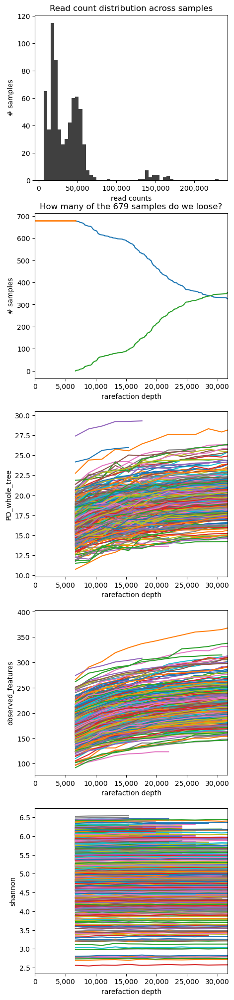

In [35]:
idx_control_samples = set(meta_rob[meta_rob['sample_type'].isin(['sterile water', 'control bedding', 'control food'])].index)
res_rob = process_study(
    metadata=meta_rob,
    control_samples=idx_control_samples,
    fp_deblur_biom=fp_counts_both,
    fp_insertiontree=seppres['paths']['insertion_tree'],
    rarefaction_depth=6000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',  # as GG2 currently lacks labels for mitochondria/chloroplasts, see https://forum.qiime2.org/t/taxonomy-filtering-greengenes2/28334
    fp_taxonomy_trained_classifier="/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg_2022_10_backbone_full_length.nb_2023.5.qza",
    tree_insert=seppres['insertion_tree'],
    is_v4_region=False,
    emperor_fp='Generated/Emperor',
    emperor_infix='_robertson',
    dry=False,
    use_grid=True, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    emperor_skip_tsne_umap=True,
)

In [36]:
dists = []
metric = 'unweighted_unifrac'
dm = res_rob['beta_diversity']['results'][metric].to_data_frame()
for (genotype_benga, generation_benga), g_benga in meta_rob[
                                       (meta_rob['skip_sample'] != True) &
                                       (meta_rob['host_scientific_name'] == "mus musculus") & 
                                       (meta_rob['sample_type'] == "colon content") & 
                                       (meta_rob['host_body_site'] == "uberon:colon") & 
                                       (meta_rob['qiita_study_id'] != 'Robertson')].fillna({'generation': 'control'}).groupby(['host_genotype', 'generation']):
    if genotype_benga == "b6cf1":
        continue
    for (genotype_rob, generation_rob, vendor_rob, experiment_rob, sample_title_rob), g_rob in meta_rob[
                                       (meta_rob['skip_sample'] != True) &
                                       (meta_rob['host_scientific_name'] == "mus musculus") & 
                                       (meta_rob['sample_type'] == "colon content") & 
                                       (meta_rob['host_body_site'] == "uberon:colon") & 
                                       (meta_rob['qiita_study_id'] == 'Robertson')].fillna({'sample_title':'?'}).groupby(['host_genotype', 'generation','vendor','experiment', 'sample_title']):
        # print(genotype_benga, generation_benga, g_benga.shape[0], genotype_rob, generation_rob, vendor_rob, experiment_rob, g_rob.shape[0])
        dm_sub = dm.loc[list(set(g_benga.index) & set(dm.index)),
                        list(set(g_rob.index)   & set(dm.index))]
        dm_sub = dm_sub.stack().reset_index()
        dm_sub['host_genotype_benga'] = genotype_benga
        dm_sub['generation_benga'] = generation_benga
        dm_sub['generation_rob'] = generation_rob
        dm_sub['vendor_rob'] = vendor_rob
        dm_sub['experiment_rob'] = experiment_rob
        dm_sub['sample_title'] = sample_title_rob
        dists.append(dm_sub)
dists = pd.concat(dists)

In [37]:
nums = dict()
d1 = dists[dists['experiment_rob'].isin(['littermates','sentinels'])].copy()
d1['cat'] = 'host_genotype : ' + d1['host_genotype_benga'] + " VS " + d1.apply(lambda row: 'both' if row['host_genotype_benga'] == 'C' else row['vendor_rob'], axis=1)

d2 = dists[dists['experiment_rob'].isin(['littermates']) &
           (dists['host_genotype_benga'] == 'B6J') & 
           (dists['generation_rob'] == 'F2')].copy()
d2['cat'] = 'maternal legacy : ' + d2['vendor_rob']

d3 = dists[dists['experiment_rob'].isin(['littermates','sentinels']) &
           (dists['host_genotype_benga'] == 'B6J') & 
           (dists['vendor_rob'] == 'mJAX')].copy()
d3['cat'] = 'generation : ' + d3['generation_rob']

d4 = dists[dists['experiment_rob'].isin(['littermates','sentinels']) &
           (dists['host_genotype_benga'] == 'B6J') & 
           (dists['vendor_rob'] == 'mJAX') & 
           (dists['generation_rob'] == 'F2')].copy()
d4['cat'] = 'breeding : ' + d4['generation_benga']

d5 = dists[(dists['experiment_rob'] == 'co-housing') & 
           (dists['host_genotype_benga'] == 'B6J')].copy()
d5['cat'] = 'co-housing : ' + d5['sample_title']

comb_dists = pd.concat([d1, d2, d3, d4],axis=0)
comb_dists = comb_dists.rename(columns={0: metric})

nums = dict()
for c, g in comb_dists.groupby('cat'):
    nums[c] = pd.concat([meta_rob.loc[g['level_0'].unique(),:].groupby('host_genotype').size(),
                         meta_rob.loc[g['level_1'].unique(),:].groupby('vendor').size()])
#nums

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

host_genotype : B6J VS mTAC vs. host_genotype : B6J VS mJAX: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.263e-131 U_stat=1.936e+07
host_genotype : C VS both vs. host_genotype : B6J VS mTAC: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.100e-195 U_stat=2.552e+07
generation : F1 vs. generation : F2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.351e-141 U_stat=3.517e+06
generation : P1 vs. generation : F1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.686e-10 U_stat=1.385e+06
generation : F2 vs. maternal legacy : mTAC: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.012e-106 U_stat=8.252e+05
breeding : P vs. breeding : F1: Mann-Whitney-Wi

Text(0.09, 0.89, 'F')

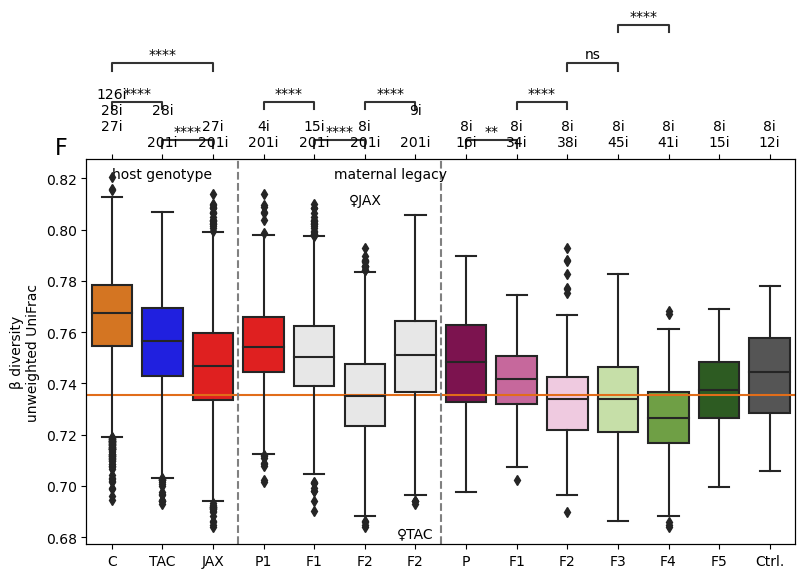

In [38]:
fig, axes = plt.subplots(1,1, figsize=(8/14*16,5)) #(8,5)

o_cat = [
    'host_genotype : C VS both', 'host_genotype : B6J VS mTAC', 'host_genotype : B6J VS mJAX',
    'generation : P1', 'generation : F1', 'generation : F2',
    'maternal legacy : mTAC', 
    'breeding : P', 'breeding : F1', 'breeding : F2', 'breeding : F3', 'breeding : F4', 'breeding : F5','breeding : control', 
]
pal = {
    'host_genotype : C VS both': COLORS['C'],
    'host_genotype : B6J VS mJAX': COLORS['mJAX'],
    'host_genotype : B6J VS mTAC': COLORS['B6J'],
    
    'generation : P1': COLORS['mJAX'], 
    'generation : F1': '#e7e7e7', 
    'generation : F2': '#e7e7e7',
    'maternal legacy : mTAC': '#e7e7e7',
    
    'breeding : P': COLORS['P'], 
    'breeding : F1': COLORS['F1'], 
    'breeding : F2': COLORS['F2'], 
    'breeding : F3': COLORS['F3'], 
    'breeding : F4': COLORS['F4'], 
    'breeding : F5': COLORS['F5'],
    'breeding : control': '#555555',
}

sns.boxplot(data=comb_dists, y=metric, x='cat', ax=axes, zorder=10, 
            order=o_cat, palette=pal,
           )
axes.axhline(y=comb_dists.groupby('cat').mean(numeric_only=True).loc['generation : F2',metric], color='#e16d1a')
axes.axvline(x=2.5, color='gray', linestyle='--')
axes.axvline(x=6.5, color='gray', linestyle='--')
axes.set_ylabel('β diversity\n%s' % DM_NAMES.get(metric))

axTop = axes.twiny()
axTop.set_xlim(axes.get_xlim())
axTop.set_xticks(axes.get_xticks(), 
                 ['\n'.join(['' if (nums[t.get_text()].to_dict().get(hg, 0) == 0) else '%ii' % nums[t.get_text()].to_dict().get(hg, 0)
                  for hg in ['C', 'mTAC', 'mJAX', 'B6J']])
                  for t in axes.get_xticklabels()])
axes.set_xticklabels(['C', 'TAC', 'JAX', 
                      'P1', 'F1', 'F2', 'F2',
                      'P', 'F1', 'F2', 'F3', 'F4', 'F5', 'Ctrl.'])
axes.set_xlabel("")

annotator = Annotator(axes, [
    ('host_genotype : B6J VS mTAC', 'host_genotype : B6J VS mJAX'),
    ('host_genotype : C VS both', 'host_genotype : B6J VS mTAC'),
    ('host_genotype : C VS both', 'host_genotype : B6J VS mJAX'),

    ('generation : F1', 'generation : F2'),
    ('generation : P1', 'generation : F1'),

    ('maternal legacy : mTAC', 'generation : F2'),

    ('breeding : P', 'breeding : F1'),
    ('breeding : F1', 'breeding : F2'),
    ('breeding : F2', 'breeding : F3'),
    ('breeding : F3', 'breeding : F4'),

], data=comb_dists, y=metric, x='cat', order=o_cat)
annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
annotator.apply_and_annotate()

axes.text(1, 0.82, 'host genotype', horizontalalignment='center')
axes.text(5.5, 0.82, 'maternal legacy', horizontalalignment='center')
axes.text(5, 0.81, '♀JAX', horizontalalignment='center')
axes.text(6, 0.68, '♀TAC', horizontalalignment='center')

plt.figtext(0.09, 0.89, 'F', fontsize=16)

## Figure 4
### Panels A,B,C

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F1_C vs. F1_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.890e-02 U_stat=7.000e+01
P_C vs. P_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.372e-01 U_stat=2.300e+01
F2_C vs. F2_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.303e-01 U_stat=1.540e+02
F3_C vs. F3_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.939e-01 U_stat=4.770e+02
F4_C vs. F4_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.164e-01 U_stat=3.750e+02
F5_C vs. F5_B6J: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.899e-01 U_stat=2.090e+02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-

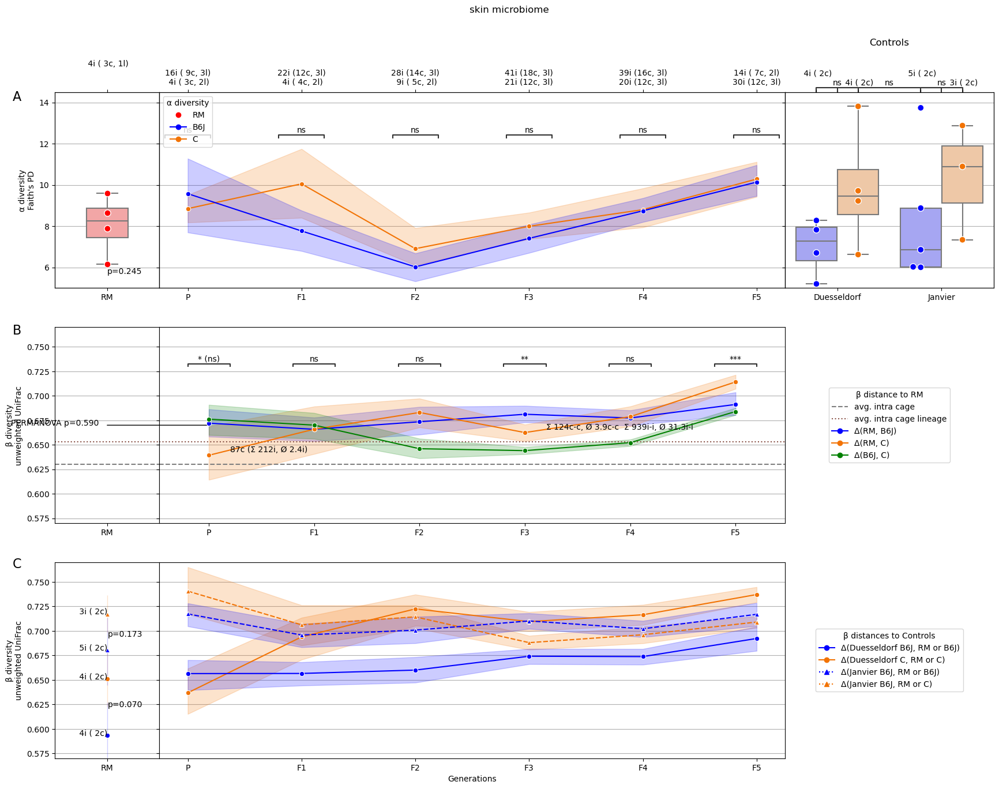

In [39]:
%matplotlib inline
fig = draw_temporals(res_skin, meta_skin, 
                     ALPHA_LIM=(5,14.5),
                     METRIC_BETA='unweighted_unifrac', BETA_LIM=(0.57, 0.77),
                     title='skin microbiome')

### Panel D

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F3_true dams vs. F3_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.968e-01 U_stat=6.366e+03
F4_true dams vs. F4_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.066e-01 U_stat=5.467e+03
F5_true dams vs. F5_other cage lineage: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.468e-01 U_stat=7.200e+02
F2_other cage lineage vs. F2_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.651e-12 U_stat=1.730e+02
F3_other cage lineage vs. F3_other genotype: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.282e-03 U_stat=1.575e+04
F4_other cage lineage vs. F4_other genotype: Mann-Whitney-Wilcoxon test two-sid

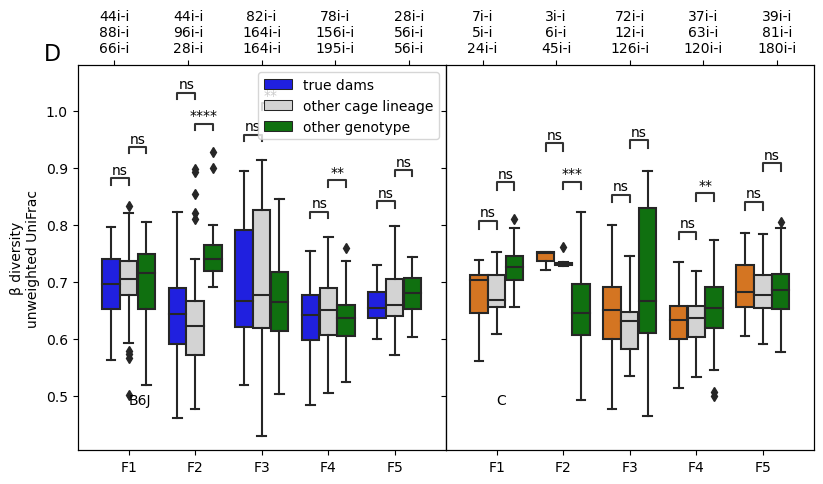

In [40]:
%matplotlib inline
fig = draw_maternalLegacy(meta_skin, res_skin['beta_diversity'], metric='unweighted_unifrac')

### Panel E

Reduced to 35 samples (feature-table had 334, metadata had 35 samples)
Using existing results from '.anacache/7cea5c8b1bff5635180a232056f2b295.sourcetracker2'. 
Reduced to 43 samples (feature-table had 334, metadata had 43 samples)
Using existing results from '.anacache/e77a63ab918776dd055f004bd2c45ae8.sourcetracker2'. 
Reduced to 72 samples (feature-table had 334, metadata had 72 samples)
Using existing results from '.anacache/40213b080e2157a54c1156dee536d59a.sourcetracker2'. 
Reduced to 70 samples (feature-table had 334, metadata had 70 samples)
Using existing results from '.anacache/7c240ed292646814d99758c0a4597516.sourcetracker2'. 
Reduced to 54 samples (feature-table had 334, metadata had 54 samples)
Using existing results from '.anacache/e73ef3b94e7487f5b1ac012c94cd9148.sourcetracker2'. 


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_other cage lineage vs. F2_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.714e-01 U_stat=2.207e+03
F1_other cage lineage vs. F1_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.616e-01 U_stat=1.783e+03
F3_other cage lineage vs. F3_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.696e-01 U_stat=6.499e+03
F4_other cage lineage vs. F4_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.021e-01 U_stat=5.286e+03
F5_other cage lineage vs. F5_true dams: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.121e-01 U_stat=9.160e+02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
   

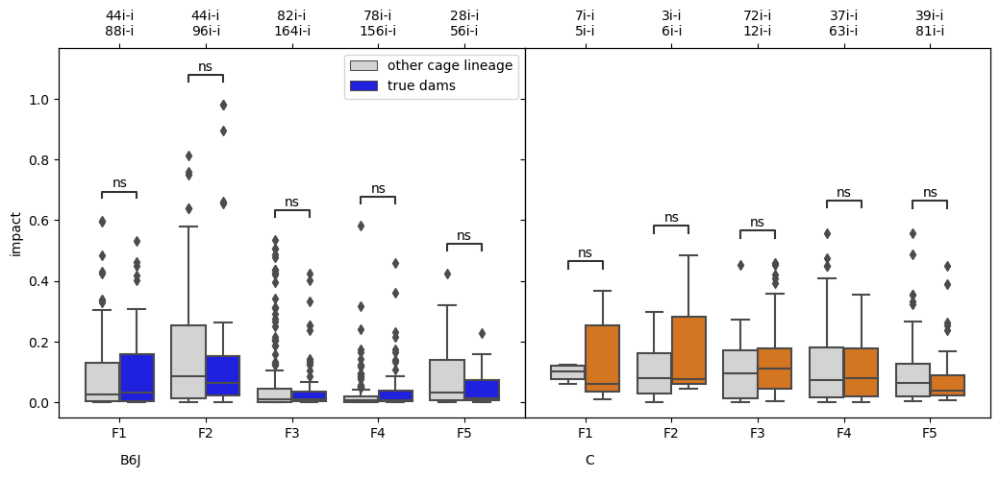

In [41]:
%matplotlib inline
fig = draw_maternalLegacy_sourcetracker(meta_skin, res_skin['counts_plantsremoved'])

## Figure 5
### Panel A

In [42]:
def drawTaxBarplot(res, meta, title='gut microbiome', minreadnr=60*270*0.5, rank='Genus'):
    fig, axes = plt.subplots(3,1,figsize=(40,5+2), gridspec_kw={'height_ratios': [10, 0.5, 0.5]})
    tax = plotTaxonomy(res['rarefaction']['results'], 
                       meta.fillna('Controls').sort_values(by='generation_cageline', key=KEY_TAXPLOT),
                       file_taxonomy=res['taxonomy']['RDP']['results']['Taxon'],
                       group_l1='sample_category', 
                       group_l2='generation_cageline', 
                       rank=rank,
                       min_abundance_grayscale=0.0, grayscale=True,
                       no_top_labels=True, no_sample_numbers=True,
                       print_meanrelabunances=True, 
                       minreadnr=minreadnr, 
                       ax=axes[0], horizontal_spacer=3)

    for ax in axes[1:]:
        ax.set_xlim(axes[0].get_xlim())
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.set_ylim((0,1))
        ax.set_facecolor("white")

    for _, row in tax[2].iterrows():
        axes[1].add_patch(Rectangle((row['xpos'], 0), 1, 1, linewidth=None, color=COLORS.get(row['group_l2'].split('_')[0], 'white')))
        axes[2].add_patch(Rectangle((row['xpos'], 0), 1, 1, linewidth=None, color=COLORS.get(row['group_l2'].split('_')[-1], 'white')))

    for (field, pos, ax) in [('generation', 0, axes[1]), ('cage_line', -1, axes[2])]:
        tax[2][field] = tax[2]['group_l2'].apply(lambda x: x.split('_')[pos])
        tax[2]['run_%s' % field] = tax[2].ne(tax[2].shift()).cumsum()[field]
        for run, g in tax[2].groupby('run_%s' % field, sort=False):
            text = g[field].unique()[0]
            if g['group_l2'].unique()[0] != text:
                ax.text(g['xpos'].mean(), 0.2, text, horizontalalignment='center')   
    fig.suptitle(title)
    return fig

128 taxa left after collapsing to Genus.
333 samples left with metadata and counts.
raw counts: 333
raw meta: 333
meta with counts: 333 samples x 94 fields
counts with meta: 333
saved plotting 0 boxes.


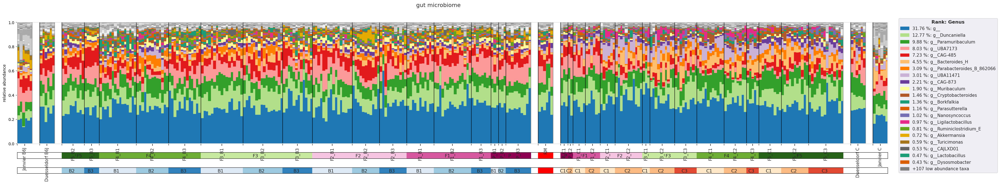

In [43]:
%matplotlib inline
fig = drawTaxBarplot(res_gut, meta_gut)

### Panel B

In [44]:
name_map = OrderedDict([
    ('s__UBA11471 sp000434215', 'species UBA11471 of order Bacteroidales'),
    ('s__Bacteroides_H acidifaciens', 'Bacteroides H acidifaciens'),
    ('s__Bacteroides_H caecimuris', 'Bacteroides H caecimuris'),
    ('s__UBA7173 sp002491305', 'a species of genus UBA7173, family Muribaculacea'),
    ('s__CAG-485 sp002493045', 'a species of genus CAG-485, family Muribaculacea'),
    ('s__UBA7173 sp900540205', 'a species of genus UBA7173, family Muribaculacea'),
    ('s__Paramuribaculum sp000431155', 'Paramuribaculum sp000431155'),
    ('s__Muribaculum intestinale', 'Muribaculum intestinale'),
    ('s__Muribaculum gordoncarteri', 'Muribaculum gordoncarteri'),
    ('s__Akkermansia muciniphila_D_776786', 'Akkermansia muciniphila D 776786'),
    ('s__Parasutterella sp009767915', 'Parasutterella sp009767915'),
    ('s__Ruminiclostridium_E siraeum', 'Ruminiclostridium E siraeum')
])

103 taxa left after collapsing to Species.


Reduced to 327 samples (feature-table had 333, metadata had 327 samples)
Using existing results from '.anacache/8e5a01875bd6416b1185bb452903a3d6.ancom'. 


,significantly different,>= 0.007000 mean rel. abundance,#Species
3,True,True,12
2,True,False,21
1,False,True,10
0,False,False,60


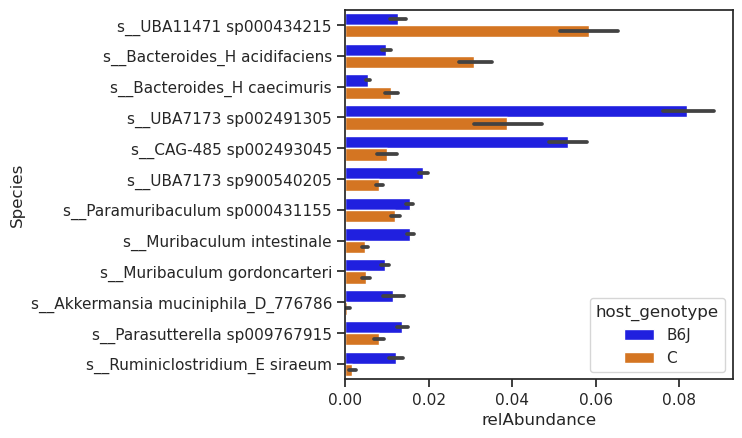

In [47]:
%matplotlib inline
sns.set_style("ticks")
res_ancom = ancom(
    res_gut['rarefaction']['results'],
    #res_gut['counts_plantsremoved'],
    rank=('Species'),
    taxonomy=res_gut['taxonomy']['RDP']['results']['Taxon'],
    grouping=meta_gut[(meta_gut['host_genotype'] != 'RM')]['host_genotype'],
    dry=False, wait=False, min_mean_abundance_per_feature=0.007,
    post_cache_arguments={'palette': COLORS, 'feature_order': list(name_map.keys()), 'hue_order': ['B6J', 'C']})

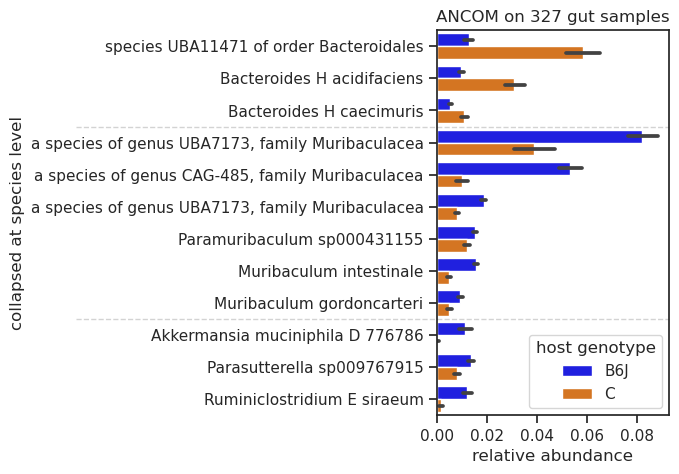

In [48]:
%matplotlib inline
ax = res_ancom['results']['figure'].get_axes()[0]
ax.set_yticks(ax.get_yticks(), [name_map.get(t.get_text(), t.get_text()) 
                                for t in ax.get_yticklabels()])
ax.set_ylabel("collapsed at species level")
ax.set_title("ANCOM on %i gut samples" % len(res_ancom['results']['features']['sample_name'].unique()))
ax.set_xlabel("relative abundance")
ax.get_legend().set_title("host genotype")
ax.axhline(y=3-0.5, linestyle='dashed', linewidth=1, color='lightgray', xmin=-1.55, xmax=1, clip_on = False)
ax.axhline(y=3+6-0.5, linestyle='dashed', linewidth=1, color='lightgray', xmin=-1.55, xmax=1, clip_on = False)
fig = res_ancom['results']['figure']
fig.set_size_inches((3, 5))
fig

The following graph supports the statement in the discussion, that we can treat the significantly differentially abundant Genus "Ruminiclostridium" as equivalent to the Genus "Ruminococcus", which was discussed in Horne et al. 2019. The reason is a different taxonomic assignment, depending on the version of the GreenGenes database.

GG 13.8: Of the 3407 ASVs in our experiment, 12 ASVs get assigned to Genus 'Ruminococcus'
GG 2   : Of the 3407 ASVs in our experiment,  5 ASVs get assigned to Genus 'Ruminiclostridium'


Using existing results from '.anacache/01cfd1f4d662ff78471d74fb1ce94cd5.taxRDP'. 


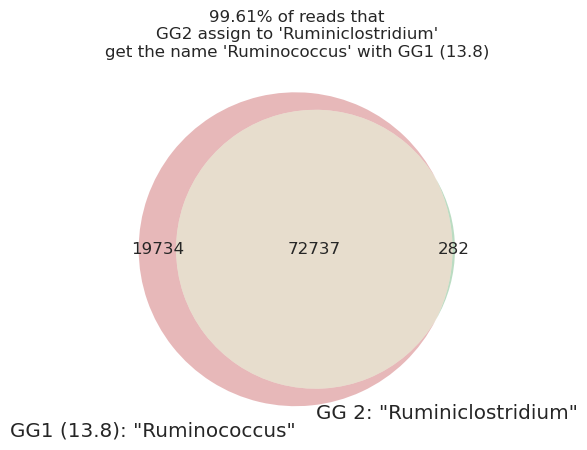

In [49]:
def draw_Rumi_equivalence(tax_gg2, counts):
    # taxonomic assignment with GG1, i.e. release 13.8
    res_tax_gg1 = taxonomy_RDP(
        counts, 
        "/homes/sjanssen/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza", # obtained from https://data.qiime2.org/2022.11/common/gg-13-8-99-nb-classifier.qza
        dry=False, use_grid=True)
    gg1_featname = 'Ruminococcus'
    gg1_rumi = res_tax_gg1['results'][res_tax_gg1['results']['Taxon'].apply(lambda x: 'Ruminococcus' in x)]
    print("GG 13.8: Of the %i ASVs in our experiment, %s ASVs get assigned to Genus '%s'" % (
        counts.shape[0], 
        ', '.join(map(str, gg1_rumi.groupby('Taxon').size().unique())),
        gg1_featname))

    gg2_featname = 'Ruminiclostridium'
    gg2_rumi = tax_gg2[tax_gg2['Taxon'].apply(lambda x: gg2_featname in x)]
    print("GG 2   : Of the %i ASVs in our experiment,  %s ASVs get assigned to Genus '%s'" % (
        counts.shape[0], 
        ', '.join(map(str, gg2_rumi.groupby('Taxon').size().unique())),
        gg2_featname))

    size_gg2 = counts.loc[list((set(gg2_rumi.index) - set(gg1_rumi.index)) & set(counts.index)),:].sum(axis=1).sum()
    size_both = counts.loc[list((set(gg1_rumi.index) & set(gg2_rumi.index)) & set(counts.index)),:].sum(axis=1).sum()
    fig, axes = plt.subplots()
    venn2(subsets=(counts.loc[list((set(gg1_rumi.index) - set(gg2_rumi.index)) & set(counts.index)),:].sum(axis=1).sum(),
                   size_gg2,
                   size_both, 
                  ), set_labels=('GG1 (13.8): "%s"' % gg1_featname, 'GG 2: "%s"' % gg2_featname), ax=axes)
    _ = axes.set_title("%.2f%% of reads that\nGG2 assign to '%s'\nget the name '%s' with GG1 (13.8)" % (
        (1 - (size_gg2 / (size_both + size_gg2))) * 100, gg2_featname, gg1_featname))
    return fig

fig = draw_Rumi_equivalence(res_both['taxonomy']['RDP']['results'], res_both['counts_plantsStillIn'])

### Panel C

103 taxa left after collapsing to Species.


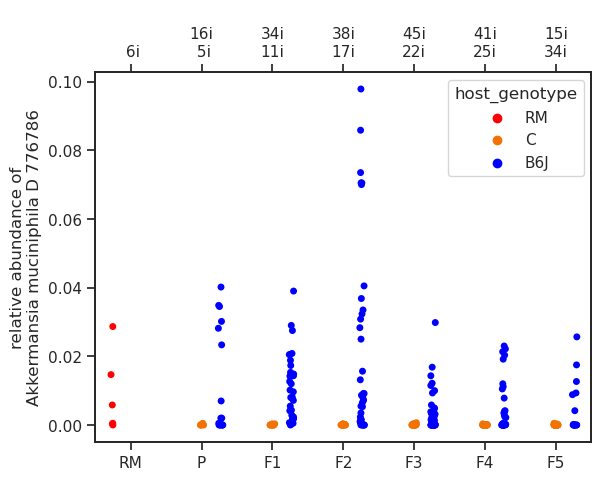

In [50]:
%matplotlib inline
sns.set_style("ticks")
feature = 's__Akkermansia muciniphila_D_776786'

cs = collapseCounts_objects(
    res_gut['rarefaction']['results'], 
    'Species', 
    taxonomy=res_gut['taxonomy']['RDP']['results']['Taxon'])[0]
cs /= cs.sum()
data = meta_gut[pd.notnull(meta_gut['generation'])].merge(
    cs.loc[[feature], :].T, 
    left_index=True, right_index=True, how='left')
numSamples = get_sample_numbers(data)

fig, axes = plt.subplots(1,1)#,figsize=(8,6))

sns.stripplot(data=data,
              y=feature, x='generation', hue='host_genotype', 
              palette=COLORS, dodge=True, order=ORDER_GENERATIONS[:-1],
              ax=axes)
axes.set_ylabel("relative abundance of\n%s" % name_map.get(feature))
axes.set_xlabel("")

axTop = axes.twiny()
axTop.set_xlim(axes.get_xlim())
_ = axTop.set_xticks(axes.get_xticks(), 
                     labels=[get_sample_label(generation, numSamples, justI=True) 
                             for generation in ORDER_GENERATIONS[:-1]])

In [51]:
data.groupby('host_genotype')[feature].max()['B6J']

0.09783333333333333

## Figure 6

found matching working dir "/homes/sjanssen/TMP/ana_fRDAbeta_n9hao4zs"


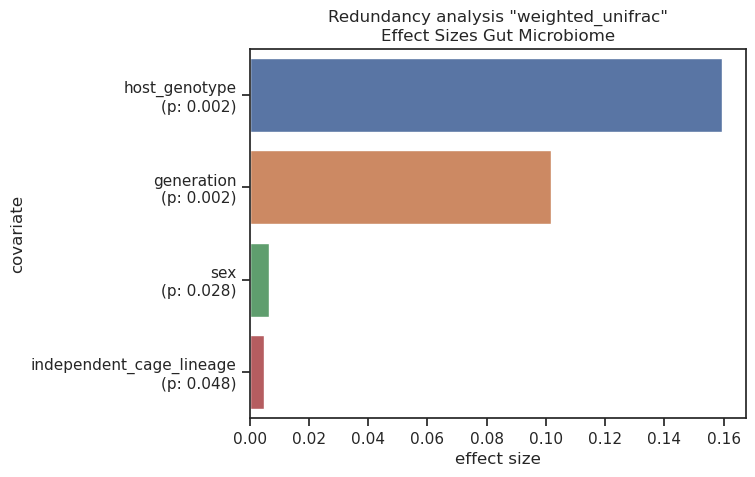

In [52]:
sns.set_style("ticks")
rred = redundancy_analysis_beta(meta_gut, 
                                res_gut['beta_diversity']['results']['weighted_unifrac'], 
                                'weighted_unifrac',
                                categorials=['host_genotype','independent_cage_lineage','sex'], 
                                intervals=[], dates={},
                                ordinals={'generation': ORDER_GENERATIONS},
                                title='Effect Sizes Gut Microbiome',
                                dry=False, wait=False, #dirty=True,, 
                                nocache=True, dirty=True,
                                seed=68  # set a seed to the permutations engine of ordiR2step: https://stackoverflow.com/questions/30251636/reproducing-results-from-ordistep
                               )

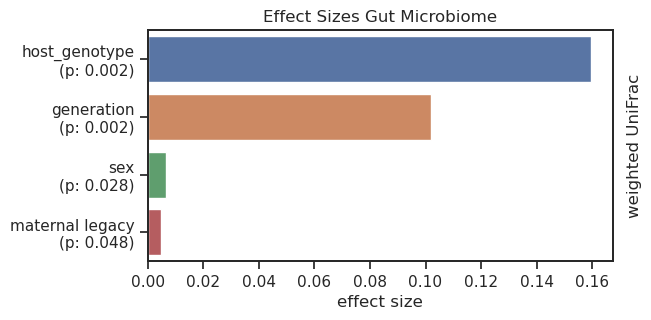

In [53]:
# style the figure
axes = rred['results']['figure'].get_axes()[0]
axes.set_title('Effect Sizes Gut Microbiome')
axes.set_ylabel("")
axR = axes.twinx()
axR.set_ylabel("weighted UniFrac")
axR.set_yticks([])
axes.set_yticklabels([t.get_text().replace('independent_cage_lineage', 'maternal legacy') for t in axes.get_yticklabels()])
rred['results']['figure'].set_size_inches((6, 3))
# rred['results']['figure'].savefig('Figures/fig6_gutEffectSizes.svg', bbox_inches='tight')
rred['results']['figure']

## Figure 7

In [54]:
fp_metabolites = 'Incoming/220511__Data_21-0025.xlsx'
x = pd.read_excel(fp_metabolites, sheet_name="01.AllData").rename(columns={'Sample.label.on.tube': 'sample_name'})
x['sample_name'] = 'sample.' + x['sample_name'].astype(str)
data = x[['sample_name', "ISTD", "Resp", "ISTD.Resp", "Resp.Ratio", "UserAnno.Peak", "MI.Peak", "MZ", "MZ.Ex.Left", "MZ.Ex.Right", "MZ.Ex.Units", "RT.Compound", "RT.Peak", "MS.Replicates", "data.source", "ISTD.Resp.Ratio", "Acq.Method.Condensed", "MS.project", "Report.Name", "data.dir", "relativeResponse", "IQR_1.5_outlier", "Compound"]].set_index(['sample_name', 'Compound'])
counts_chems = pd.pivot_table(data=data, columns='sample_name', index="Compound", values="relativeResponse").fillna(0)
# remove compounds containing 'unknown' in its name
counts_chems = counts_chems.loc[[c for c in counts_chems.index if 'unknown' not in c], :]

# also load metadata from Excel sheet that Philipp Westhoff provided
meta_chems = x[['sample_name', "date", "MS.Label", "Species", "Tissue.type", "Condition.1", "Generation", "Benga-Nr."]].set_index(['sample_name']).drop_duplicates().rename(columns={'Condition.1': 'genotype', 'Generation': 'generation'})
meta_chems['Benga-Nr.'] = meta_chems['Benga-Nr.'].astype(str)

# merge metadata from Philipp and Qiita
meta_chems = meta_chems.reset_index().merge(metadata.groupby('host_subject_id_bmfz').head(1), left_on='Benga-Nr.', right_on='host_subject_id_bmfz', how='left').set_index('sample_name')

res_beta_chems = beta_diversity(counts_chems, metrics=['bray_curtis'], dry=False, wait=False)
if res_beta_chems['results'] is not None:
    res_emp_chems = emperor(meta_chems, res_beta_chems['results'], fp_results='Generated/Emperor/', infix='_metabolites', run_tsne_umap=False, dry=False, wait=False)

found matching working dir "/homes/sjanssen/TMP/ana_bdiv_186zko2z"
 Was removed.
Working directory is '/homes/sjanssen/TMP/ana_emperor_cqww_rt2', cachefile is '.anacache/2468971b1b06a71d95a2e0ee5c9fcdb7.emperor'. Now wait until 21503979 job finishes.


### Panel A
Use `Generated/Emperor/emperor-pcoa_metabolites_bray_curtis` to upload to `view.qiime2.org`

see Figure 2, but load settings from file `EmperorSettings/emp_settings_metabolites.json`
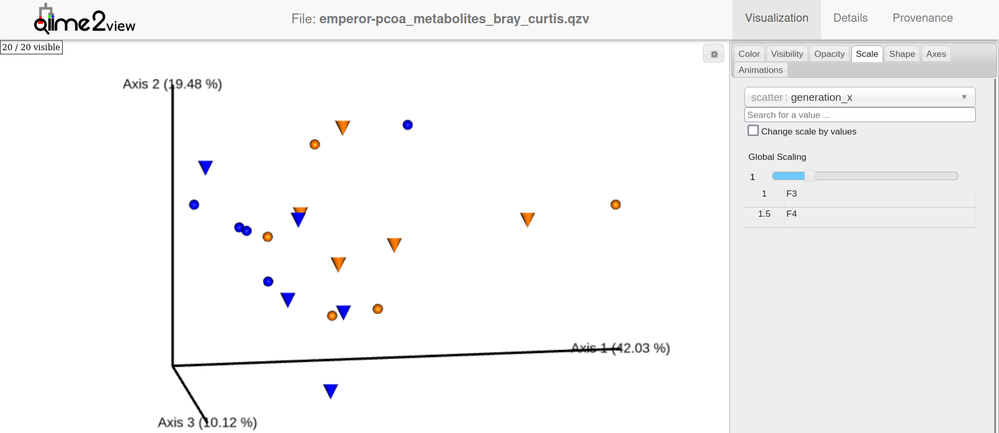


### Panel B

/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:1886: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  in groupings.value_counts().iteritems()


Text(0.09, 0.89, 'B')

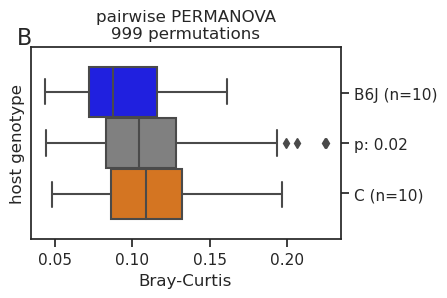

In [55]:
dm = res_beta_chems['results']['bray_curtis']
metacol = meta_chems['host_genotype']
fig, axes = plt.subplots(figsize=(4,2.5))
testres = detect_distant_groups(dm, 'Bray-Curtis', metacol)
p = plotGroup_permanovas(dm, metacol, **testres, 
                         ax=axes, horizontal=True, colors_boxplot={'left': COLORS['B6J'],
                                                                   'right': COLORS['C'],
                                                                   'between': 'gray'})
axes.set_ylabel('host genotype')
axes.yaxis.label.set_visible(True)
axes.set_title('pairwise PERMANOVA\n999 permutations')
offset = 0.26
_ = axes.set_yticks([-1*offset,0,offset], ['B6J (n=%i)' % meta_chems['host_genotype'].value_counts().loc['B6J'], 
                                           'p: %.2f' % testres['network']['B6J']['C']['p-value'], 
                                           'C (n=%i)' % meta_chems['host_genotype'].value_counts().loc['C']])
plt.figtext(0.09, 0.89, 'B', fontsize=16)

### Panel C

/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:1886: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  in groupings.value_counts().iteritems()


Text(0.09, 0.89, 'C')

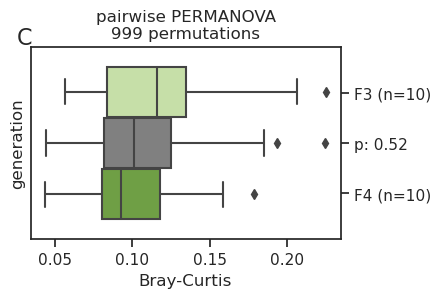

In [56]:
metacol = meta_chems['generation_y']
fig, axes = plt.subplots(figsize=(4,2.5))
testres = detect_distant_groups(dm, 'Bray-Curtis', metacol)
p = plotGroup_permanovas(dm, metacol, **testres, 
                         ax=axes, horizontal=True, colors_boxplot={'left': COLORS['F3'],
                                                                   'right': COLORS['F4'],
                                                                   'between': 'gray'})
axes.set_ylabel('generation')
axes.yaxis.label.set_visible(True)
axes.set_title('pairwise PERMANOVA\n999 permutations')
offset = 0.26
_ = axes.set_yticks([-1*offset,0,offset], ['F3 (n=%i)' % meta_chems['generation_x'].value_counts().loc['F3'], 
                                           'p: %.2f' % testres['network']['F3']['F4']['p-value'], 
                                           'F4 (n=%i)' % meta_chems['generation_x'].value_counts().loc['F4']])
plt.figtext(0.09, 0.89, 'C', fontsize=16)

### Panel D

/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:2403: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  metadata = metadata.loc[set(calour_experiment.sample_metadata.index) & set(metadata.index), :]
/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:2338: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  metadata = metadata.loc[set(calour_experiment.sample_metadata.index) & set(metadata.index), :]


'host_genotype'  (n=10)
     6 (of   41) taxa different between 'B6J' (n=5) vs. 'C' (n=5)



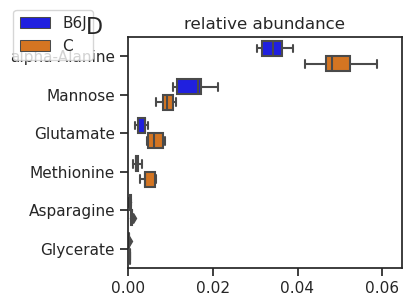

In [57]:
dsFDR_experiment = dict()
# for dsFDR
pandas2biom('tmp_dir/tmp_dsfrd_metabolome.biom', counts_chems)
meta_chems.to_csv('tmp_dir/tmp_dsfdr_metabolome_meta.tsv', sep="\t", index=True)

dsFDR_experiment = ca.read_amplicon('tmp_dir/tmp_dsfrd_metabolome.biom', 
                                    'tmp_dir/tmp_dsfdr_metabolome_meta.tsv', min_reads=0, normalize=10000)

field = 'host_genotype'
res_dsFDR_genotype = find_diff_taxa(dsFDR_experiment, meta_chems[meta_chems['generation_x'] == 'F4'], [field],
                                    random_seed=43)

if len(res_dsFDR_genotype) > 0:
    p = plot_diff_taxa(counts_chems, meta_chems[meta_chems['generation_x'] == 'F4'][field], res_dsFDR_genotype,
                       min_mean_abundance=0.0,
                       colors_boxplot=COLORS, 
                       color_barplot='gray'
                      )
    p[0].get_axes()[0].set_ylabel("compound")
    
    p[0].delaxes(p[0].get_axes()[2])
    p[0].delaxes(p[0].get_axes()[1])
    
    p[0].get_axes()[0].set_ylabel("")
    p[0].get_axes()[0].set_title("relative abundance")
    p[0].get_axes()[0].set_xlabel("")
    p[0].suptitle("")
    plt.figtext(0.09, 0.89, 'D', fontsize=16)
    p[0].set_size_inches((4*3, 3))

### Panel E

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

all mice_RM vs. all mice_C: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.720e-04 U_stat=5.700e+01
RM & P mice_B6J vs. RM & P mice_RM: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.577e-01 U_stat=5.100e+01
RM & P mice_RM vs. RM & P mice_C: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.658e-03 U_stat=1.000e+00
all mice_B6J vs. all mice_RM: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.808e-01 U_stat=6.020e+02
RM & P mice_C vs. all mice_C: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.237e-01 U_stat=2.305e+02


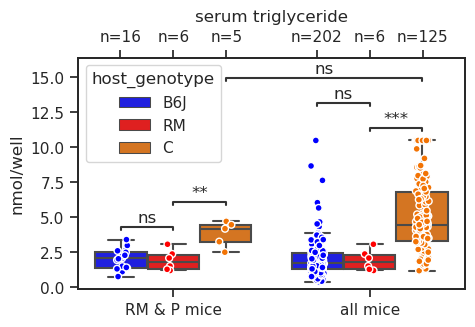

In [58]:
%matplotlib inline
meta_tri = metadata[metadata['host_scientific_name'] == 'mus musculus'].groupby('host_subject_id_bmfz').head(1).copy()
if meta_tri[meta_tri['generation'] == 'rm'].shape[0] < 12:
    meta_tri['category'] = meta_tri['generation'].apply(lambda x: 'RM & P mice' if x in ['P','RM'] else 'all mice')
    dupl_rm = meta_tri[meta_tri['generation'].isin(['RM','P'])].copy()
    dupl_rm['category'] = 'all mice'
    meta_tri = pd.concat([meta_tri, dupl_rm]).reset_index()

fig, axes = plt.subplots(1,1,figsize=(5,3))

hue_order = ['B6J','RM','C']
sns.boxplot(data=meta_tri, y='serum_triglyceride', x='category', hue='host_genotype', palette=COLORS, ax=axes, 
            hue_order=hue_order,
            dodge=True, fliersize=0)

sns.stripplot(data=meta_tri, y='serum_triglyceride', x='category', hue='host_genotype', palette=COLORS, ax=axes, 
              hue_order=hue_order,
              dodge=True, edgecolor='white', linewidth=1, legend=None)

annotator = Annotator(axes, 
    [(('RM & P mice', 'RM'), ('RM & P mice', 'B6J')), 
     (('RM & P mice', 'RM'), ('RM & P mice', 'C')), 
     
     (('all mice', 'RM'), ('all mice', 'C')), 
     (('all mice', 'RM'), ('all mice', 'B6J')), 
     
     (('RM & P mice', 'C'), ('all mice', 'C')), 
     ], 
    data=meta_tri, x='category', y='serum_triglyceride', hue='host_genotype', hue_order=hue_order)
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
_ = annotator.apply_and_annotate()


axes.set_ylabel('nmol/well')
axes.set_xlabel('')
axes.set_title('serum triglyceride')

nums = meta_tri.dropna(subset=['serum_triglyceride']).groupby(['category', 'host_genotype']).size()
axTop = axes.twiny()
axTop.set_xlim(axes.get_xlim())
offset = 0.27
_ = axTop.set_xticks([0-offset, 0, 0+offset, 1-offset, 1, 1+offset],
                     ['n=%i' % x for x in  nums.loc[['RM & P mice', 'all mice'],hue_order].values])


## Figure S1

In [59]:
# create an emperor plot ONLY from samples of mice, bodysites gut or skin (skip resequenced batch 2 skin samples)
_ = emperor(metadata[(metadata['host_scientific_name'] == 'mus musculus') & 
                     (metadata['host_body_site'] != 'uberon:epithelium of left lung') & 
                     (~((metadata['batch'] == "2") & (metadata['host_body_site'] == 'uberon:skin of external ear')))
                    ],
            res_both['beta_diversity']['results'], fp_results='Generated/Emperor', infix='_gutskin', dry=False, wait=False)

Using existing results from '.anacache/52f8cff0e63e5abd4a13cdbebc0f7f2f.emperor'. 


Use `Generated/Emperor/emperor-pcoa_gutskin_unweighted_unifrac` to upload to `view.qiime2.org`
see Figure 2, but load settings from file `EmperorSettings/emp_settings_gutANDskin.json`
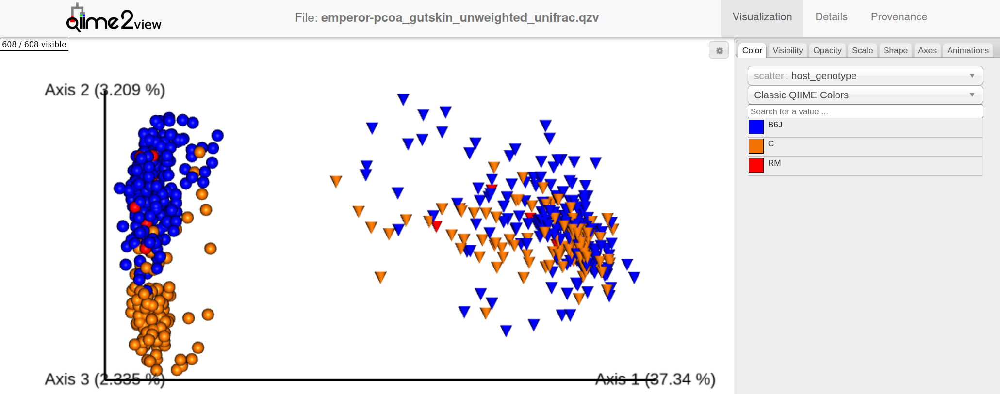

## Figure S2
Use `Generated/Emperor/emperor-pcoa_skin_weighted_unifrac.gzv` to upload to `view.qiime2.org`

### Panel A
see Figure 2, but load settings from file `EmperorSettings/emp_settings_skin_panelA.json`
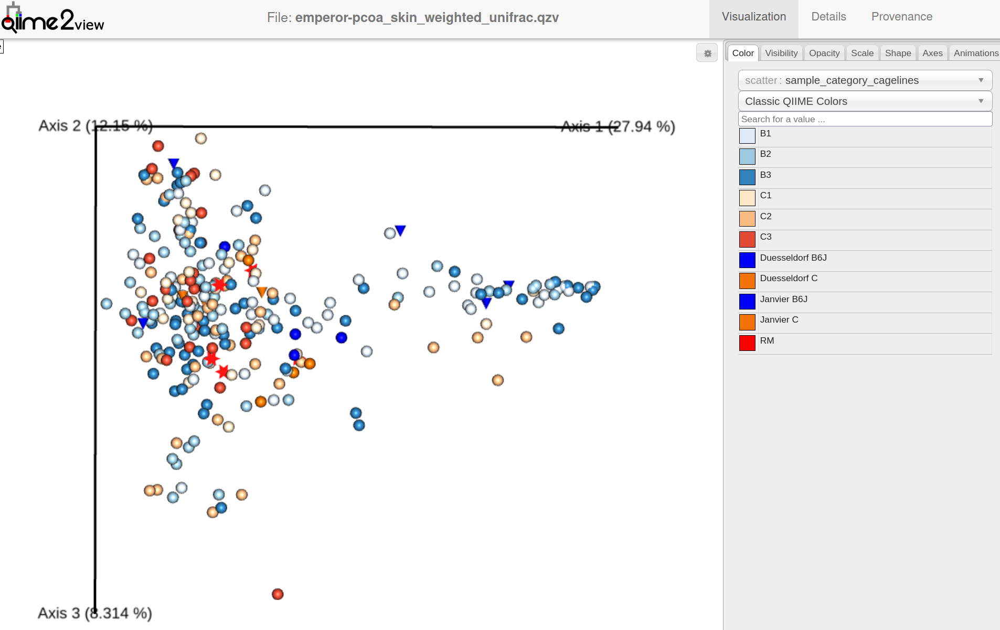

### Panel B
see Figure 2, but load settings from file `EmperorSettings/emp_settings_skin_panelB.json`
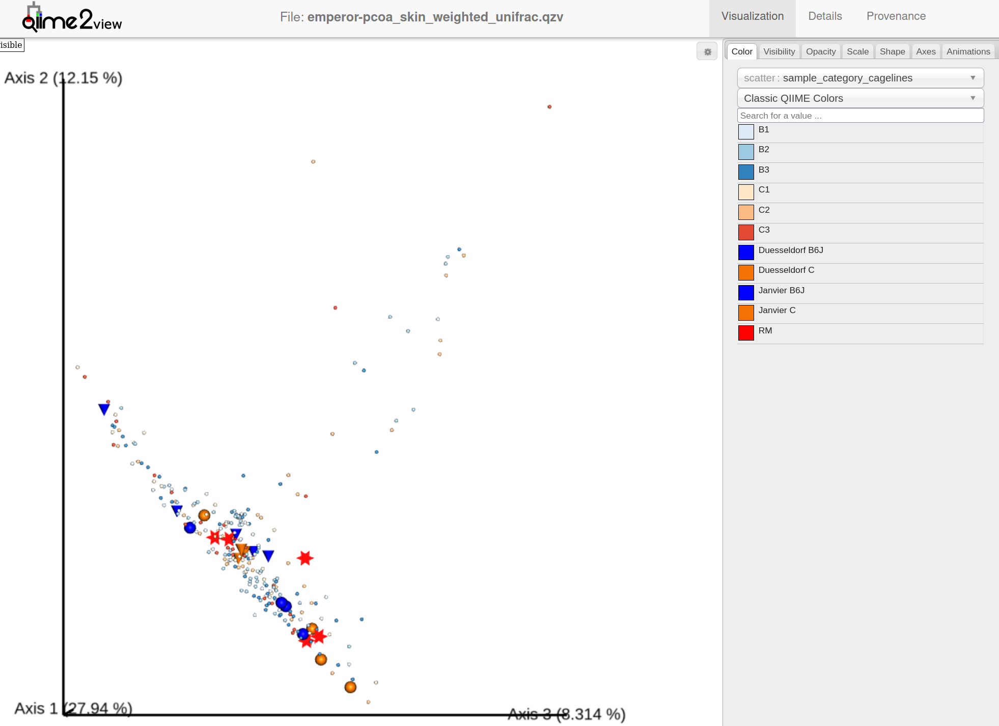

### Panel C
see Figure 2, but load settings from file `EmperorSettings/emp_settings_skin_panelC.json`
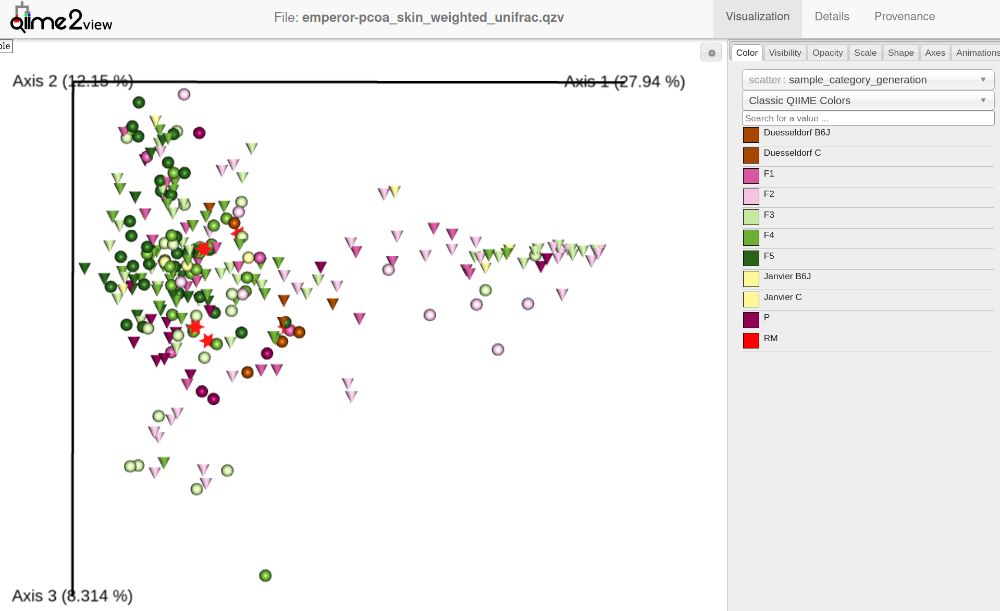

### Panel D
see Figure 2, but load settings from file `EmperorSettings/emp_settings_skin_panelD.json`
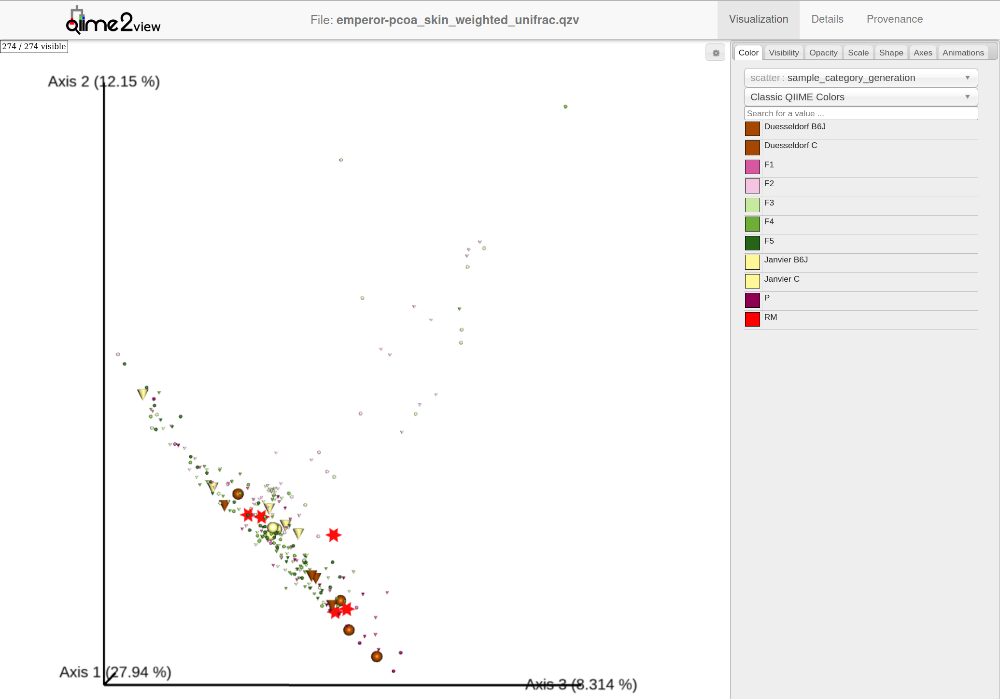

## Figure S3

In [60]:
def draw_cageline_alphadiversity(meta, alpha, title):
    def _cageline_present(genotype, numbers, generation, numSamples):
        return all([genotype[0] + str(number) in numSamples.loc[generation].index for number in numbers])

    malpha = meta.merge(alpha, left_index=True, right_index=True)
    fig, axes = plt.subplots(alpha.shape[1], len(ORDER_GENOTYPE), figsize=(15,20), sharex=True)
    fig.subplots_adjust(hspace=0.01)

    for i, genotype in enumerate(ORDER_GENOTYPE):
        for j, metric in enumerate(reversed(alpha.columns)):
            data = malpha[malpha['host_genotype'] == genotype]
            hue_order = ["%s%i" % (genotype[0], n) for n in range(1,3+1)]
            sns.boxplot(data=data, y=metric, x="generation", order=ORDER_GENERATIONS[1:-1], hue='cage_line', hue_order=hue_order, ax=axes[j,i], color='lightgray')
            sns.stripplot(data=data, y=metric, x="generation", order=ORDER_GENERATIONS[1:-1], hue='cage_line', hue_order=hue_order, ax=axes[j,i], dodge=True)

            axes[j,i].axhline(y=data[metric].mean(), color='gray', linestyle='--')

            numSamples = data.groupby(['generation','cage_line']).size()
            #if genotype == 'B6J':
            annotator = Annotator(axes[j,i],
                ([(('F4', 'B2'), ('F5', 'B2')),
                  (('F4', 'B3'), ('F5', 'B3'))] if (genotype == 'B6J') else []) + \
                [((generation, genotype[0]+'1'), (generation, genotype[0]+'2')) 
                 for generation 
                 in ORDER_GENERATIONS[1:-1] 
                 if _cageline_present(genotype, [1, 2], generation, numSamples)] + \
                [((generation, genotype[0]+'1'), (generation, genotype[0]+'3')) 
                 for generation 
                 in ORDER_GENERATIONS[1:-1]
                 if _cageline_present(genotype, [1, 3], generation, numSamples)]
                , data=data, y=metric, x="generation", order=ORDER_GENERATIONS[1:-1], hue='cage_line', hue_order=hue_order)
            annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
            annotator.apply_and_annotate()

            axes[j,i].get_legend().remove()
            if j == 0:
                axTop = axes[j,i].twiny()
                axTop.set_xlim(axes[j,i].get_xlim())
                offset = 0.20
                axTop.set_xticks(sorted(list(axes[j,i].get_xticks() - 0.33) + \
                                        list(axes[j,i].get_xticks() + 0.33) + \
                                        list(axes[j,i].get_xticks())), ['%ii' % (numSamples.loc[generation, cage_line] if _cageline_present(genotype, [cage_line[-1]], generation, numSamples) else 0)
                                                                        for generation in ORDER_GENERATIONS[1:-1] 
                                                                        for cage_line in sorted(list(data['cage_line'].dropna().unique())) 
                                                                       ])
                axes[j,i].set_title(genotype)

                axes[j,i].legend(handles=[
                    Line2D([0], [0], marker='o', color='#ffffff00', label='%s%i' % (genotype[0], n), markerfacecolor=sns.color_palette()[n-1]) for n in [1,2,3]
                    ],
                    title='%s: cage lineage' % genotype, ncol=3, bbox_to_anchor=(0.75, 1.25))


            if j < 2:
                axes[j,i].set_xlabel("")
            axes[j,i].set_ylabel(DM_NAMES.get(axes[j,i].get_ylabel(), axes[j,i].get_ylabel()))
    # fig.suptitle(title)
    
    plt.figtext(0.09, 0.87, 'A', fontsize=16)
    plt.figtext(0.09, 0.61, 'C', fontsize=16)
    plt.figtext(0.09, 0.35, 'E', fontsize=16)
    plt.figtext(0.51, 0.87, 'B', fontsize=16)
    plt.figtext(0.51, 0.61, 'D', fontsize=16)
    plt.figtext(0.51, 0.35, 'F', fontsize=16)

    return fig     

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_B1 vs. F2_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=8.800e+01
F3_B1 vs. F3_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.558e-02 (ns) U_stat=1.920e+02
F4_B1 vs. F4_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.585e-04 U_stat=1.800e+02
P_B1 vs. P_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=4.000e+00
F1_B1 vs. F1_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.323e-01 U_stat=1.120e+02
F2_B1 vs. F2_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.323e-01 U_stat=1.190e+02
F3_B1 vs. F3_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg 

/homes/sjanssen/Git/trevismd/statannotations/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_C1 vs. F2_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.011e-01 U_stat=4.400e+01
F3_C1 vs. F3_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.412e-02 (ns) U_stat=3.000e+01
F4_C1 vs. F4_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.618e-01 U_stat=6.200e+01
F5_C1 vs. F5_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.464e-02 U_stat=7.200e+01
P_C1 vs. P_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.000e-01 U_stat=6.000e+00
F1_C1 vs. F1_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.290e-01 U_stat=2.100e+01
F3_C1 vs. F3_C3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg 

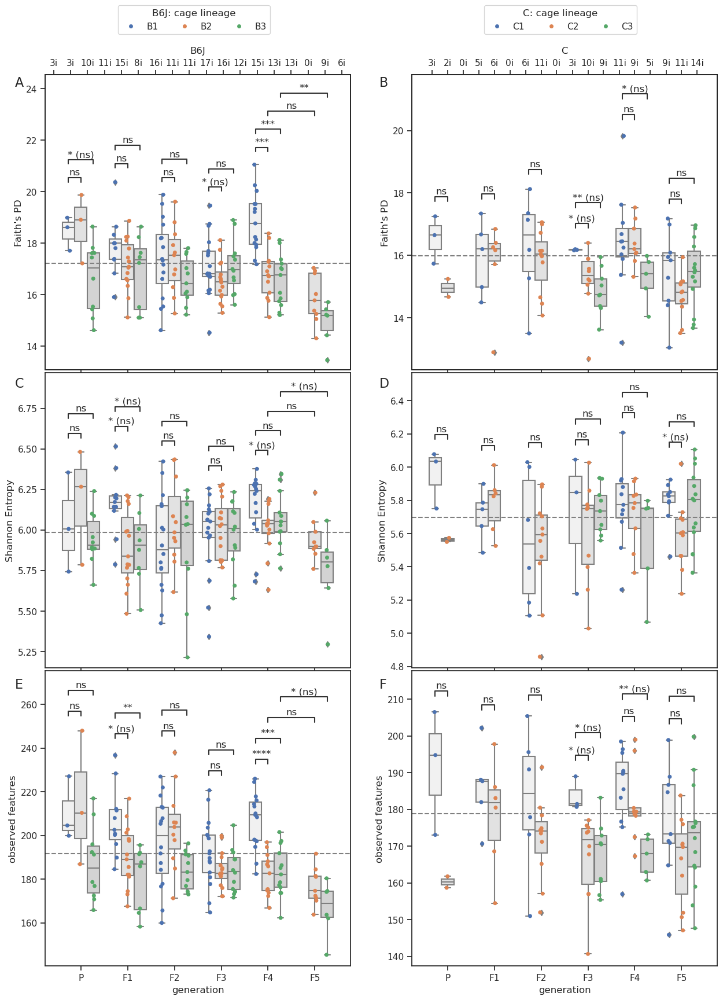

In [61]:
%matplotlib inline
fig = draw_cageline_alphadiversity(meta_gut, res_gut['alpha_diversity']['results'], title='gut microbiome')
# fig.savefig("Figures/figS3_gutAlpha.svg", bbox_inches='tight')

## Figure S4

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_B1 vs. F2_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.421e-01 U_stat=2.200e+01
F3_B1 vs. F3_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.494e-02 U_stat=4.800e+01
F4_B1 vs. F4_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.753e-01 U_stat=6.800e+01
P_B1 vs. P_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.000e-01 U_stat=6.000e+00
F1_B1 vs. F1_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.199e-02 U_stat=4.800e+01
F2_B1 vs. F2_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.777e-01 U_stat=6.900e+01
F3_B1 vs. F3_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg corre

/homes/sjanssen/Git/trevismd/statannotations/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_B1 vs. F2_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.058e-01 U_stat=2.300e+01
F3_B1 vs. F3_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.358e-03 U_stat=4.000e+01
F4_B1 vs. F4_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.817e-01 U_stat=9.700e+01
P_B1 vs. P_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.000e-01 U_stat=6.000e+00
F1_B1 vs. F1_B2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.070e-01 U_stat=3.200e+01
F2_B1 vs. F2_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.350e-01 U_stat=7.200e+01
F3_B1 vs. F3_B3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg corre

/homes/sjanssen/Git/trevismd/statannotations/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_C1 vs. F2_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.476e-01 U_stat=6.000e+00
F3_C1 vs. F3_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.734e-01 U_stat=1.100e+01
F4_C1 vs. F4_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.623e-01 U_stat=3.400e+01
F5_C1 vs. F5_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.445e-02 U_stat=1.700e+01
P_C1 vs. P_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=2.000e+00
F1_C1 vs. F1_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.000e-01 U_stat=3.000e+00
F3_C1 vs. F3_C3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg corre

/homes/sjanssen/Git/trevismd/statannotations/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

F2_C1 vs. F2_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.476e-01 U_stat=1.200e+01
F3_C1 vs. F3_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.608e-01 U_stat=6.000e+00
F4_C1 vs. F4_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.362e-01 U_stat=4.200e+01
F5_C1 vs. F5_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.359e-01 U_stat=2.300e+01
P_C1 vs. P_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=2.000e+00
F1_C1 vs. F1_C2: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.000e-01 U_stat=3.000e+00
F3_C1 vs. F3_C3: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg corre

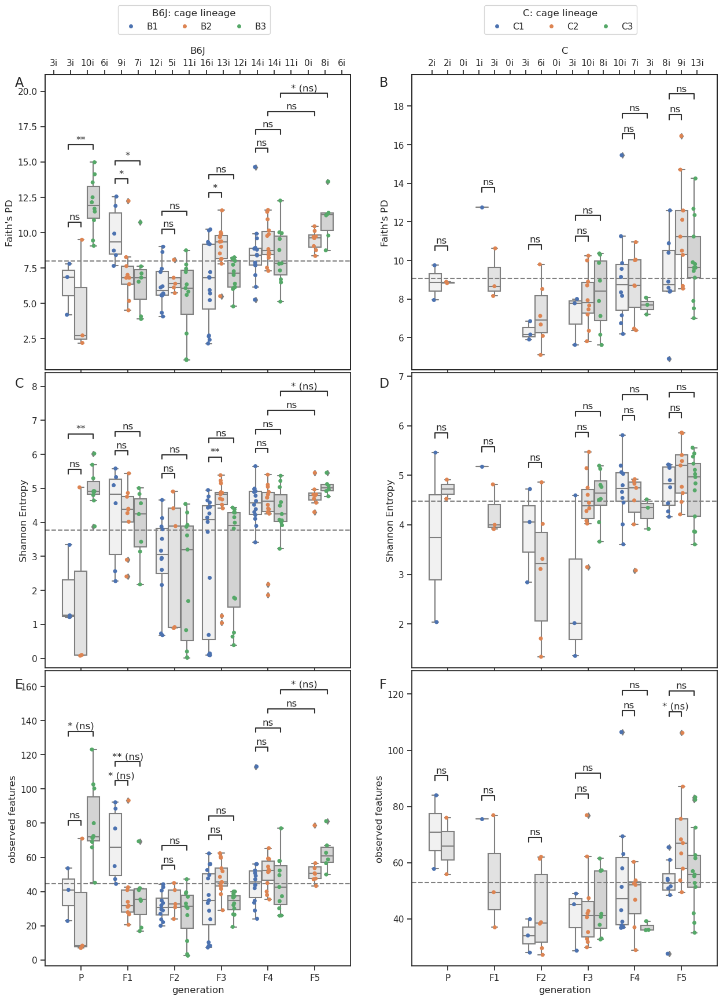

In [62]:
%matplotlib inline
fig = draw_cageline_alphadiversity(meta_skin, res_skin['alpha_diversity']['results'], title='skin microbiome')
# fig.savefig("Figures/figS4_skinAlpha.svg", bbox_inches='tight')

## Figures S5

In [63]:
#adding int to generation to properly list generations in upsetplots
conditions = [
    (meta_gut["generation"] == "RM"),
    (meta_gut["generation"] == "P"),
    (meta_gut["generation"] == "F1"),
    (meta_gut["generation"] == "F2"),
    (meta_gut["generation"] == "F3"),
    (meta_gut["generation"] == "F4"),
    (meta_gut["generation"] == "F5")
]

values = ["-1: RM", "0: P", "1: F1", "2: F2", "3: F3", "4: F4", "5: F5"]
meta_gut["i_gen"] = np.select(conditions, values, "other")
conditions = [
    (meta_skin["generation"] == "RM"),
    (meta_skin["generation"] == "P"),
    (meta_skin["generation"] == "F1"),
    (meta_skin["generation"] == "F2"),
    (meta_skin["generation"] == "F3"),
    (meta_skin["generation"] == "F4"),
    (meta_skin["generation"] == "F5")
]

values = ["-1: RM", "0: P", "1: F1", "2: F2", "3: F3", "4: F4", "5: F5"]
meta_skin["i_gen"] = np.select(conditions, values, "other")

In [64]:
def pick_rank(counts, taxa, rank):
    # split information in taxa table per rank and assign proper names to each column
    taxa_split = taxa["Taxon"].str.split(pat=";", expand=True)
    taxa_split = taxa_split.rename(columns={0: "domain", 1: "phylum", 2: "class", 3: "order", 4: "family", 5: "genus", 6: "species"})
    # copy counts DataFrame to avoid chagnes being made to imported feature tables
    taxa_counts = counts.copy()
    taxa_counts[rank] = taxa_split[rank]
    # grouping taxa by rank, collapsing feature tables
    grouped_counts = taxa_counts.groupby(rank).sum(numeric_only=True)
    return(grouped_counts)

def make_upset(counts, meta, category, plotname, taxa=None, rank=None, title=""):
    # if rank is give, collapse feature table to rank, else process ASVs
    if rank != None:
        upset = pick_rank(counts, taxa, rank)
        upset = upset.transpose()
    else:
        upset = counts.transpose()
    # adding category to feature table + control to filter out control samples
    upset[category] = meta[category]
    upset['control'] = meta['control']
    upset = upset.drop(upset[upset['control'].isin(["Duesseldorf","Janvier"])].index)
    # grouping by category and omitting taxa not present in all samples
    upset_grouped = upset.groupby(category).sum(numeric_only=True)
    upset_grouped = upset_grouped.loc[:, (upset_grouped != 0).any(axis=0)]
    # assign boolean values of True/False depending on whether values are > 0 or not, combining with the actual values and assigning the boolean columns as indeces
    upset_grouped = upset_grouped.transpose()
    over_zero = upset_grouped > 0
    over_zero = over_zero.rename(columns=lambda x: x + ' ')
    upset_combined = pd.concat([upset_grouped, over_zero],axis=1)
    upset_combined = upset_combined.set_index(list(over_zero.columns))
    # plotting upsetplot with the plot() function
    fig = upsetplot.plot(upset_combined, show_counts=True, subset_size="count", sort_categories_by="-input")
    plt.title(title)
    plt.figtext(0.09, 0.89, plotname, fontsize=16)

### Panel A

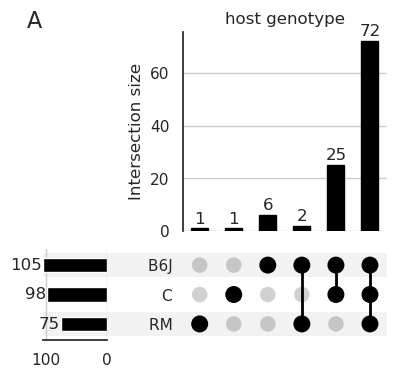

In [65]:
sns.set_style("white")
make_upset(res_gut['counts_plantsremoved'], meta_gut, "host_genotype", "A", res_gut['taxonomy']['RDP']['results'], "genus", title='host genotype')

### Panel B

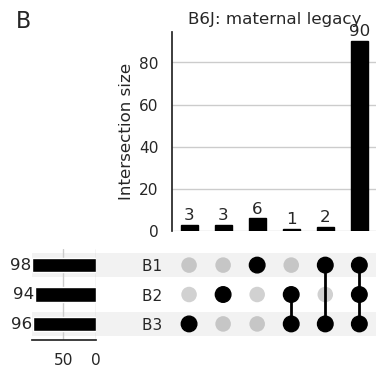

In [66]:
make_upset(res_gut['counts_plantsremoved'].loc[:, meta_gut[meta_gut['host_genotype'] == 'B6J'].index], 
           meta_gut, "cage_line", "B", res_gut['taxonomy']['RDP']['results'], "genus", title='B6J: maternal legacy')

### Panel C

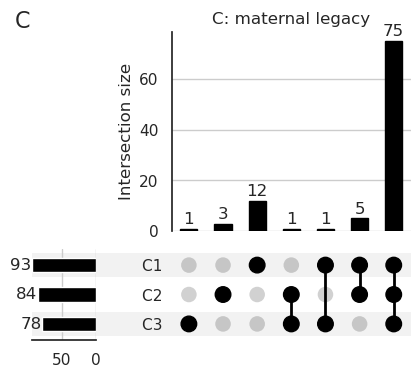

In [67]:
make_upset(res_gut['counts_plantsremoved'].loc[:, meta_gut[meta_gut['host_genotype'] == 'C'].index], 
           meta_gut, "cage_line", "C", res_gut['taxonomy']['RDP']['results'], "genus", title='C: maternal legacy')

### Panel D

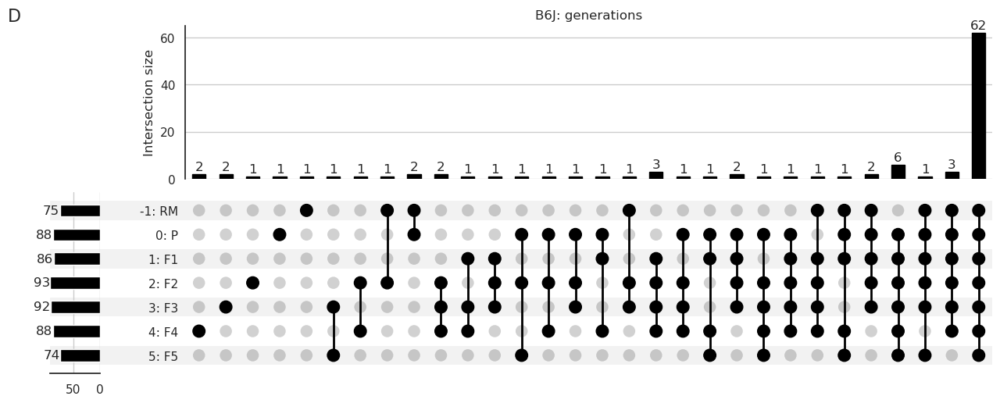

In [68]:
make_upset(res_gut['counts_plantsremoved'].loc[:, meta_gut[meta_gut['host_genotype'].isin(['B6J', 'RM'])].index], 
           meta_gut, "i_gen", "D", res_gut['taxonomy']['RDP']['results'], "genus", title="B6J: generations")

### Panel E

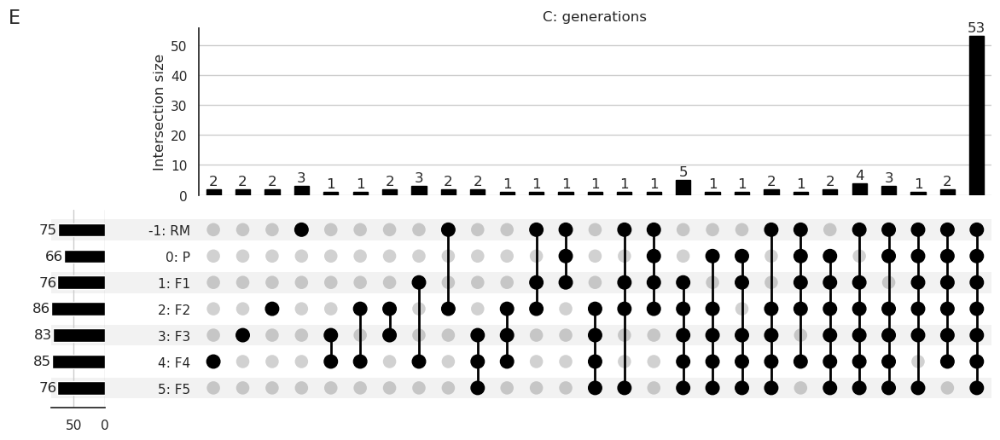

In [69]:
make_upset(res_gut['counts_plantsremoved'].loc[:, meta_gut[meta_gut['host_genotype'].isin(['C', 'RM'])].index], 
           meta_gut, "i_gen", "E", res_gut['taxonomy']['RDP']['results'], "genus", title='C: generations')

## Figures S6

### Panel A

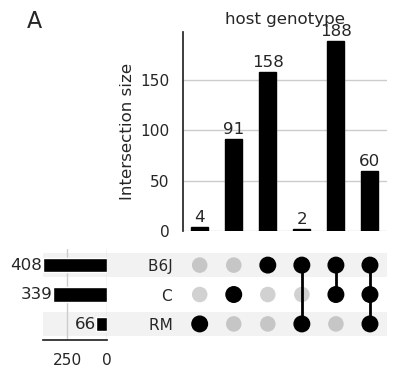

In [70]:
sns.set_style("white")
make_upset(res_skin['counts_plantsremoved'], meta_skin, "host_genotype", "A", res_skin['taxonomy']['RDP']['results'], "genus", title='host genotype')

### Panel B

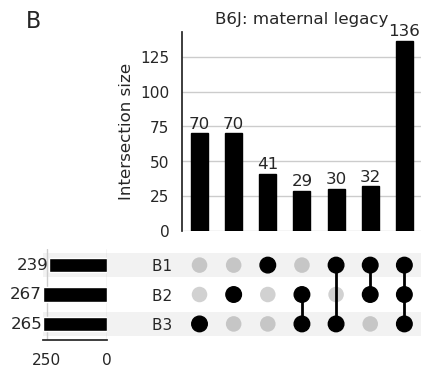

In [71]:
make_upset(res_skin['counts_plantsremoved'].loc[:, meta_skin[meta_skin['host_genotype'] == 'B6J'].index], 
           meta_skin, "cage_line", "B", res_skin['taxonomy']['RDP']['results'], "genus", title='B6J: maternal legacy')

### Panel C

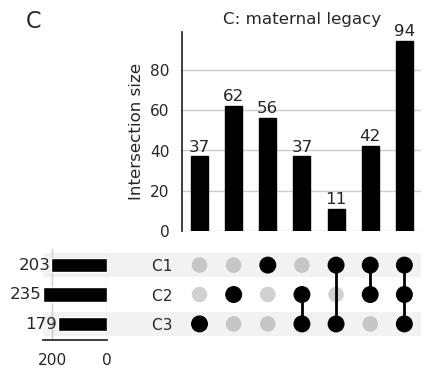

In [72]:
make_upset(res_skin['counts_plantsremoved'].loc[:, meta_skin[meta_skin['host_genotype'] == 'C'].index], 
           meta_skin, "cage_line", "C", res_skin['taxonomy']['RDP']['results'], "genus", title='C: maternal legacy')

### Panel D

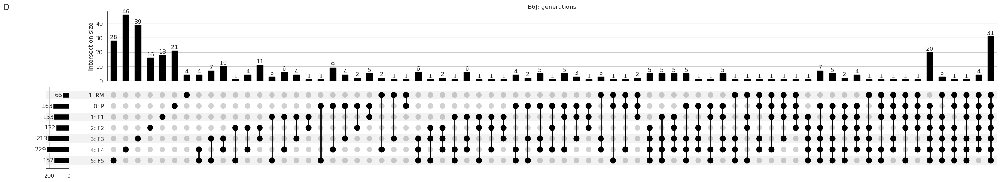

In [73]:
make_upset(res_skin['counts_plantsremoved'].loc[:, meta_skin[meta_skin['host_genotype'].isin(['B6J', 'RM'])].index], 
           meta_skin, "i_gen", "D", res_skin['taxonomy']['RDP']['results'], "genus", title="B6J: generations")

### Panel E

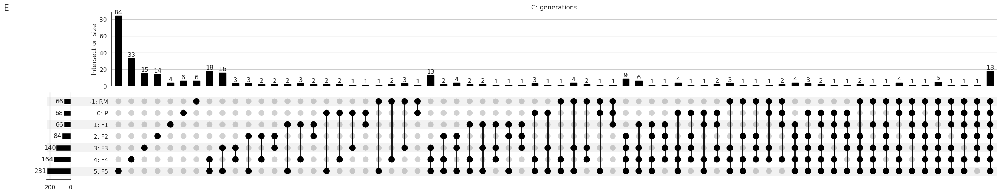

In [74]:
make_upset(res_skin['counts_plantsremoved'].loc[:, meta_skin[meta_skin['host_genotype'].isin(['C', 'RM'])].index], 
           meta_skin, "i_gen", "E", res_skin['taxonomy']['RDP']['results'], "genus", title='C: generations')

## Figure S7
### Panel A

14 taxa left after collapsing to Phylum.
333 samples left with metadata and counts.
raw counts: 333
raw meta: 333
meta with counts: 333 samples x 95 fields
counts with meta: 333
saved plotting 0 boxes.


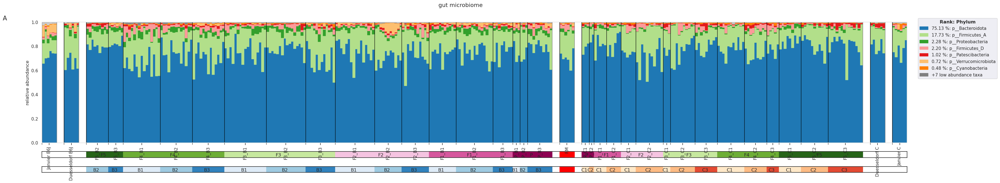

In [75]:
%matplotlib inline
fig = drawTaxBarplot(res_gut, meta_gut, rank='Phylum')
_ = plt.figtext(0.09, 0.89, 'A', fontsize=16)

### Panel B

38 taxa left after collapsing to Phylum.
268 samples left with metadata and counts.
raw counts: 268
raw meta: 268
meta with counts: 268 samples x 95 fields
counts with meta: 268
saved plotting 0 boxes.


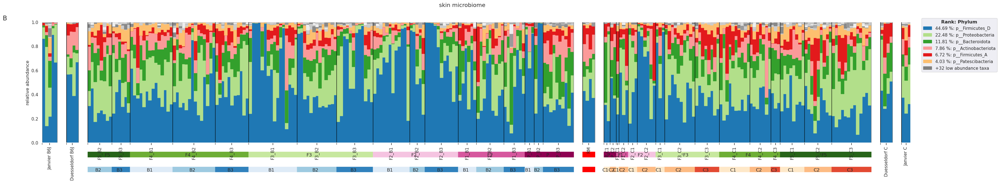

In [76]:
%matplotlib inline
fig = drawTaxBarplot(res_skin, meta_skin,  title='skin microbiome', minreadnr=60*60*0.5, rank='Phylum')
_ = plt.figtext(0.09, 0.89, 'B', fontsize=16)

### Panel C

504 taxa left after collapsing to Genus.
268 samples left with metadata and counts.
raw counts: 268
raw meta: 268
meta with counts: 268 samples x 95 fields
counts with meta: 268
saved plotting 90 boxes.


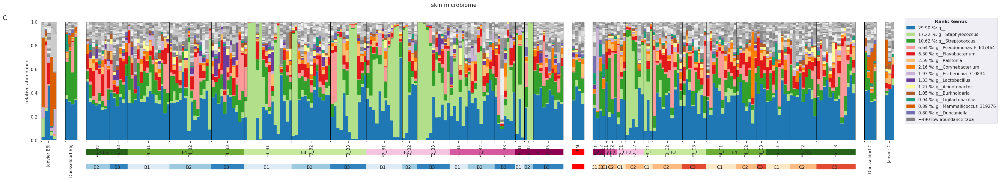

In [77]:
%matplotlib inline
fig = drawTaxBarplot(res_skin, meta_skin, title='skin microbiome', minreadnr=60*60*0.5)
_ = plt.figtext(0.09, 0.89, 'C', fontsize=16)

## Figure S8
### Panel A

In [78]:
def get_type(row):
    if row['Source'] == 'Unknown':
        return row['Source']
    elif row['Source'] == 'control_bedding':
        return "bedding"
    elif row['Source'] == 'control_food':
        return "food"
    elif row['Source'] == row['host_genotype']:
        return "feces from matching host genotype"
    elif row['Source'] != row['host_genotype']:
        return "feces from opposing host genotype"

meta_st2_gs = metadata[
                       (metadata['host_scientific_name'] != 'callithrix jacchus') &
                        metadata['sample_type'].isin(['control bedding','control food','skin of external ear','colon content'])
                      ].copy().fillna({'generation': 'control'})

res_impact = []
res_st2_gs = dict()
for generation, g in meta_st2_gs[meta_st2_gs['sample_type'].isin(['colon content', 'skin of external ear'])].groupby('generation'):
    meta_gen = pd.concat([g, meta_st2_gs[meta_st2_gs['sample_type'].isin(['control bedding', 'control food'])]], axis=0)
    
    meta_gen['st2_type'] = 'Sink'
    meta_gen.loc[meta_gen[meta_gen['sample_type'].isin(['control bedding', 'control food', 'colon content'])].index, 'st2_type'] = 'Source'
    meta_gen['st2_env'] = meta_gen.apply(lambda r: r['host_genotype'] if pd.notnull(r['host_genotype']) else r['sample_type'], axis=1)
    res_st2_gs[generation] = sourcetracker2(res_both['counts_plantsremoved'], meta_gen, col_envname='st2_env', col_type='st2_type', dry=False, wait=False)
    
    if res_st2_gs[generation]['results'] is not None:
        d = res_st2_gs[generation]['results'].stack().reset_index().rename(columns={0: 'impact'}).merge(metadata[['host_genotype','generation','geo_loc_name']], left_on='Sink', right_index=True, how='left')
        d['type'] = d.apply(get_type, axis=1)
        d['generation'] = generation.replace('control', 'Controls')
       
        res_impact.append(d)
res_impact = pd.concat(res_impact)

Reduced to 100 samples (feature-table had 779, metadata had 100 samples)
Using existing results from '.anacache/b452089af6013e0e47b24d7a98b9f7ae.sourcetracker2'. 
Reduced to 120 samples (feature-table had 779, metadata had 120 samples)
Using existing results from '.anacache/66bf870f1820ab91d5895dcfc08fa7fb.sourcetracker2'. 
Reduced to 144 samples (feature-table had 779, metadata had 144 samples)
Using existing results from '.anacache/761331a21330530f45289789f80ba1da.sourcetracker2'. 
Reduced to 144 samples (feature-table had 779, metadata had 144 samples)
Using existing results from '.anacache/4851370834dfd873e93fee2d8f6f8119.sourcetracker2'. 
Reduced to 108 samples (feature-table had 779, metadata had 108 samples)
Using existing results from '.anacache/75f0fff9b0fd81a13b812a72de6d2953.sourcetracker2'. 
Reduced to 52 samples (feature-table had 779, metadata had 52 samples)
Using existing results from '.anacache/c675d66a4c233f1be34e0532a4fc0d86.sourcetracker2'. 
Reduced to 22 samples (f

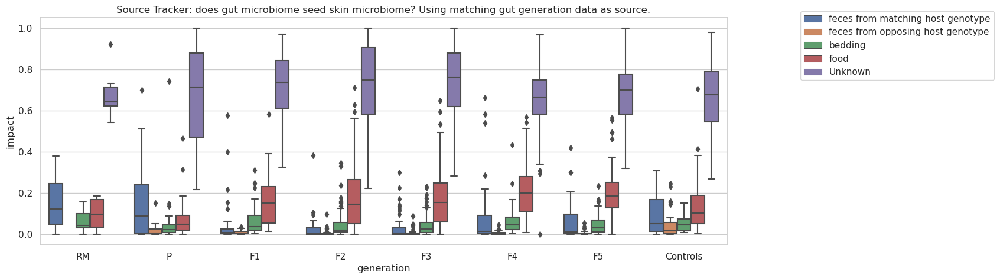

In [79]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1,1,figsize=(15,5))
sns.boxplot(data=res_impact, y='impact', hue='type', x='generation', order=ORDER_GENERATIONS, ax=axes,
            hue_order=['feces from matching host genotype', 'feces from opposing host genotype', 'bedding', 'food', 'Unknown'])
axes.legend(bbox_to_anchor=(1.1, 1.05))
_ = axes.set_title("Source Tracker: does gut microbiome seed skin microbiome? Using matching gut generation data as source.")

## Figure S9
### Panel A

21 taxa left after collapsing to Phylum.
453 samples left with metadata and counts.
13 taxa left after filtering low abundant.


/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:804: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  meta['help_plottaxonomy_level_0'] = 'all'


raw counts: 679
raw meta: 453
meta with counts: 453 samples x 102 fields
counts with meta: 453


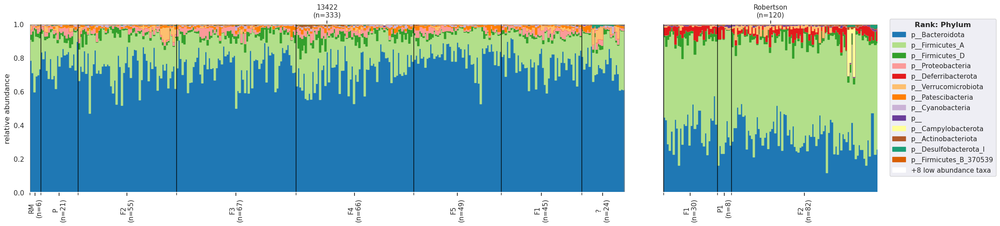

In [83]:
p = plotTaxonomy(res_rob['counts_plantsremoved'], meta_rob[meta_rob['host_body_site'] == 'uberon:colon'].fillna('?'), file_taxonomy=res_rob['taxonomy']['RDP']['results']['Taxon'],
                 group_l1='qiita_study_id', rank='Phylum', group_l2='generation',
                 print_sample_labels=False, minreadnr=1000)
p[0].set_size_inches((25, 5))
p[0].savefig('Figures/figS9_taxonomyRobertson.svg')